### **Current Crop Assessment**


Conduct field observations of at least two wheat fields in Huron County OR analyze remote sensing data:
* Document growth stages using the Feekes or Zadoks scale
* Assess stand density (plants per square foot)
* Evaluate overall crop health and uniformity
* Note any visible stress factors
* Create a visual representation of current crop status across the county


Investigate methods to automate crop assessment through:
* Satellite imagery and vegetation indices (NDVI, EVI)
* Drone-based monitoring systems
*Computer vision approaches for growth stage identification

-------------------------------------------------------------
--------------------------------------------------------------
----------------------------------------------
ToDo
* look for a feekes scale dataset so that I can have truth in ML models
* for stand density try NDVI normalized by GDD, LAI? (Look at Head Count on the USDA NASS)
* Evaluate overall crop health and uniformity (NDVI)
* Use MS or HS to find any visible stress factors
* figure out a way to predict crop status (e.g. feekes and potential problems) ***VISUAL***
* Investigate NDVI vs EVI
* CNN-LSTM, ViT approaches to id growth stages
---------------------------------------------------------
------------------------------------------------------
-----------------------------------------------------
Next steps:

* Crop ID
* Getting Planting Date (Some reigions get thrown off)
* Vernalization robust GDD
* Use NDVI instead of GDD to do growth stages
* Potentially get a labled dataset so that we could do computer vision ML prediction of growth stages using VI. (I looked for a labled dataset and couldn't find one)



### Import, Install, etc

In [ ]:
!pip install pystac-client
!pip install shapely
!pip install rasterio
!pip install stackstac
!pip install rioxarray
!pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.8/206.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 32.6 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import polars as pl
import numpy as np
import matplotlib.pyplot as plt
import stackstac
import xarray as xr



import geemap
import ee

In [ ]:
ee.Authenticate()
ee.Initialize(project='static-potion-450322-u2') # this is the project for Ag Genius for porter.olson11@gmail.com

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!wget https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2023_30m_cdls.zip -O cdl_2023.zip
!wget https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2024_30m_cdls.zip -O cdl_2024.zip

!unzip -q cdl_2023.zip -d cdl_2023
!unzip -q cdl_2024.zip -d cdl_2024


In [ ]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from rasterio.features import shapes
from shapely.geometry import shape
import numpy as np
import matplotlib.pyplot as plt
import os



# Load Huron County boundary GeoJSON
gdf = gpd.read_file('/content/huron_county.geojson')

# Years to process
years = range(2019, 2025)

# CDL class codes that correspond to winter wheat and double crops
winter_wheat_classes = [24, 26, 36]

for year in years:
    print(f"\nProcessing {year}...")

    tif_path = f"cdl_{year}/{year}_30m_cdls.tif"

    if not os.path.exists(tif_path):
        print(f"⚠️ File not found: {tif_path}")
        continue

    with rasterio.open(tif_path) as src:
        raster_crs = src.crs
        gdf_proj = gdf.to_crs(raster_crs)
        huron_geom = [feature["geometry"] for feature in gdf_proj.__geo_interface__["features"]]

        # Clip raster to Huron County
        out_image, out_transform = mask(src, huron_geom, crop=True)
        out_meta = src.meta

    # Build winter wheat mask
    cdl_huron = out_image[0]
    wheat_mask = np.isin(cdl_huron, winter_wheat_classes)

    # Plot mask
    plt.imshow(wheat_mask, cmap="Greens")
    plt.title(f"Winter Wheat + Double Crop (CDL {year}) in Huron County")
    plt.axis("off")
    plt.show()

    # Convert to polygons
    wheat_mask_uint8 = wheat_mask.astype(np.uint8)
    results = list(shapes(wheat_mask_uint8, mask=wheat_mask, transform=out_transform))
    geoms = [shape(geom) for geom, value in results if value == 1]

    wheat_gdf = gpd.GeoDataFrame(geometry=geoms, crs=out_meta["crs"])
    wheat_gdf = wheat_gdf.explode(index_parts=False).reset_index(drop=True)

    # Save as GeoJSON
    output_path = f"huron_winter_wheat_{year}.geojson"
    wheat_gdf.to_file(output_path, driver="GeoJSON")
    print(f"✅ Saved: {output_path}")


  Growth stage predictor

Notes rn: how can i get current crop stage by field. The GDD will be similar however NDVI might differ a lot. Perhaps starting with GDD and then predicting the amount we need to go up or down to predict a stage given the NDVI.

-------------
so perhaps one way to do it is find the GDD per pixel, then the GDD predicted growth stage (use a bigger scale e.g. Zadoks so we have less error). Then we take the NDVI value and the GDD predicted stage and then train an ML model to predict the actual stage given that info per pixel.

### GDD Calculations (Winter Wheat from Jan 1)
--------------------------------
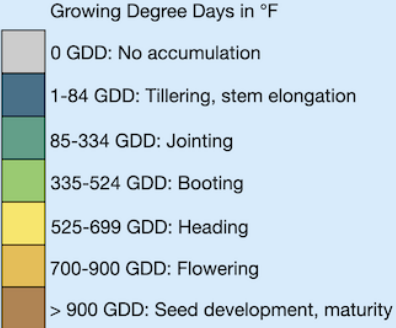





In [ ]:
import requests
import pandas as pd
import io
import os
from calendar import monthrange

def download_nclimgrid_county(var, start_year=2023, end_year=2025, save_folder="noaa_data"):
    os.makedirs(save_folder, exist_ok=True)
    base_url = "https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages"
    all_dfs = []

    for year in range(start_year, end_year + 1):
        for month in range(1, 13):
            if year == 2025 and month > 4:
                break  # Stop after April 2025

            ym = f"{year}{month:02d}"
            url = f"{base_url}/{year}/{var}-{ym}-cty-scaled.csv"
            print(f"📥 Downloading {url}")
            try:
                r = requests.get(url)
                r.raise_for_status()

                # Read CSV with no header
                df = pd.read_csv(io.StringIO(r.text), header=None)

                # Drop columns with any -999.99
                df = df.loc[:, ~(df == -999.99).any()]

                # Figure out how many days in the month
                days_in_month = monthrange(year, month)[1]

                # Assign column names
                col_names = ['index', 'level', 'fips', 'year', 'month', 'obs']
                day_columns = [str(day) for day in range(1, days_in_month + 1)]
                df.columns = col_names + day_columns

                # Reshape to long format
                df_long = df.melt(
                    id_vars=['level', 'fips', 'year', 'month', 'obs'],
                    value_vars=day_columns,
                    var_name='day',
                    value_name=var
                )

                # Convert to datetime
                df_long['day'] = df_long['day'].astype(int)
                df_long['date'] = pd.to_datetime(dict(
                    year=df_long['year'],
                    month=df_long['month'],
                    day=df_long['day']
                ))

                # ✅ Convert Celsius to Fahrenheit
                df_long[var] = df_long[var] * 9 / 5 + 32

                # Optional: Keep only relevant columns
                df_long = df_long[['fips', 'level', 'obs', 'date', var]]

                all_dfs.append(df_long)

                # Save raw CSV
                with open(f"{save_folder}/{var}-{ym}-cty-scaled.csv", "w") as f:
                    f.write(r.text)

            except requests.HTTPError as e:
                print(f"⚠️ Failed to download {url}: {e}")

    # Combine all monthly long-format data
    combined_df = pd.concat(all_dfs, ignore_index=True)
    return combined_df

# 🔁 Download & convert both Tmin and Tmax
tmin_df = download_nclimgrid_county("tmin")
tmax_df = download_nclimgrid_county("tmax")

# 💾 Save final long-format CSVs
tmin_df.to_csv("tmin_county_2023_2025_long.csv", index=False)
tmax_df.to_csv("tmax_county_2023_2025_long.csv", index=False)

print("✅ Download, reshaping, and Fahrenheit conversion complete.")


📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202301-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202302-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202303-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202304-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202305-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202306-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202307-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202308-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202309-cty-scaled.csv
📥 Downloading https

In [ ]:
#convert them to polars
tmax=pl.DataFrame(tmax_df)
tmax=tmax.select(['level','date','tmax','fips'])
tmin=pl.DataFrame(tmin_df)
tmin=tmin.select(['level','date','tmin','fips'])

temp_df=tmax.join(tmin,on=['level','date','fips'])
temp_df=temp_df.sort(['level','date'])


In [ ]:
#base is 32
#upper limit is 86
# GDD minimum: if tmin > 86, cap at 86; if tmin < 32, floor at 32
temp_df = temp_df.with_columns(
    pl.when(pl.col("tmin") > 86)
      .then(86)
    .when(pl.col("tmin") < 32)
      .then(32)
    .otherwise(pl.col("tmin"))
    .alias("gdd_min")
)

# GDD maximum: if tmax < 32, raise to 32; if tmax > 86, cap at 86
temp_df = temp_df.with_columns(
    pl.when(pl.col("tmax") < 32)
      .then(32)
    .when(pl.col("tmax") > 86)
      .then(86)
    .otherwise(pl.col("tmax"))
    .alias("gdd_max")
)

temp_df=temp_df.with_columns(
    (((pl.col('gdd_max')+pl.col('gdd_min'))/pl.lit(2))-pl.lit(32))
    .alias('GDU')
)

temp_df = temp_df.with_columns(
    pl.col("date").dt.year().alias("year")
)


temp_df=temp_df.with_columns(
    (pl.col('GDU').cum_sum().over(['level','year']))
    .alias('AGDD')
)
temp_df = temp_df.with_columns([
    # String label column (Growth_Stage)
    pl.when(pl.col("AGDD") <= 0)
      .then(pl.lit("No accumulation"))
    .when((pl.col("AGDD") > 0) & (pl.col("AGDD") <= 84))
      .then(pl.lit("Tillering, stem elongation"))
    .when((pl.col("AGDD") > 84) & (pl.col("AGDD") <= 334))
      .then(pl.lit("Jointing"))
    .when((pl.col("AGDD") > 334) & (pl.col("AGDD") <= 524))
      .then(pl.lit("Booting"))
    .when((pl.col("AGDD") > 524) & (pl.col("AGDD") <= 699))
      .then(pl.lit("Heading"))
    .when((pl.col("AGDD") > 699) & (pl.col("AGDD") <= 900))
      .then(pl.lit("Flowering"))
    .when(pl.col("AGDD") > 900)
      .then(pl.lit("Seed development, maturity"))
    .otherwise(pl.lit("Unclassified"))  # fallback just in case
    .alias("Growth_Stage"),

    # Numeric label column (Growth_Stage_Num)
    pl.when(pl.col("AGDD") <= 0)
      .then(pl.lit(1))
    .when((pl.col("AGDD") > 0) & (pl.col("AGDD") <= 84))
      .then(pl.lit(2))
    .when((pl.col("AGDD") > 84) & (pl.col("AGDD") <= 334))
      .then(pl.lit(3))
    .when((pl.col("AGDD") > 334) & (pl.col("AGDD") <= 524))
      .then(pl.lit(4))
    .when((pl.col("AGDD") > 524) & (pl.col("AGDD") <= 699))
      .then(pl.lit(5))
    .when((pl.col("AGDD") > 699) & (pl.col("AGDD") <= 900))
      .then(pl.lit(6))
    .when(pl.col("AGDD") > 900)
      .then(pl.lit(7))
    .otherwise(pl.lit(0))  # catch anything unexpected
    .alias("Growth_Stage_Num")
])

temp_df

level,date,tmax,fips,tmin,gdd_min,gdd_max,GDU,year,AGDD,Growth_Stage,Growth_Stage_Num
i64,datetime[ns],f64,str,f64,f64,f64,f64,i32,f64,str,i32
1001,2023-01-01 00:00:00,69.764,"""AL: Autauga""",52.826,52.826,69.764,29.295,2023,29.295,"""Tillering, stem elongation""",2
1001,2023-01-02 00:00:00,74.786,"""AL: Autauga""",52.988,52.988,74.786,31.887,2023,61.182,"""Tillering, stem elongation""",2
1001,2023-01-03 00:00:00,74.75,"""AL: Autauga""",57.722,57.722,74.75,34.236,2023,95.418,"""Jointing""",3
1001,2023-01-04 00:00:00,74.138,"""AL: Autauga""",60.548,60.548,74.138,35.343,2023,130.761,"""Jointing""",3
1001,2023-01-05 00:00:00,72.23,"""AL: Autauga""",42.332,42.332,72.23,25.281,2023,156.042,"""Jointing""",3
…,…,…,…,…,…,…,…,…,…,…,…
48045,2025-04-26 00:00:00,42.872,"""WY: Weston County""",34.016,34.016,42.872,6.444,2025,762.615,"""Flowering""",6
48045,2025-04-27 00:00:00,66.614,"""WY: Weston County""",38.102,38.102,66.614,20.358,2025,782.973,"""Flowering""",6
48045,2025-04-28 00:00:00,77.576,"""WY: Weston County""",44.33,44.33,77.576,28.953,2025,811.926,"""Flowering""",6


In [ ]:
temp_df.filter(pl.col('Growth_Stage_Num').is_null())

level,date,tmax,fips,tmin,gdd_min,gdd_max,GDU,year,AGDD,Growth_Stage,Growth_Stage_Num
i64,datetime[ns],f64,str,f64,f64,f64,f64,i32,f64,str,i32


In [ ]:
import geopandas as gpd
import folium
import datetime




# NOAA to official FIPS mapping
noaa_to_fips_state_map = {
    "01": "01", "02": "04", "03": "05", "04": "06", "05": "08", "06": "09",
    "07": "10", "08": "12", "09": "13", "10": "16", "11": "17", "12": "18",
    "13": "19", "14": "20", "15": "21", "16": "22", "17": "23", "18": "24",
    "19": "25", "20": "26", "21": "27", "22": "28", "23": "29", "24": "30",
    "25": "31", "26": "32", "27": "33", "28": "34", "29": "35", "30": "36",
    "31": "37", "32": "38", "33": "39", "34": "40", "35": "41", "36": "42",
    "37": "44", "38": "45", "39": "46", "40": "47", "41": "48", "42": "49",
    "43": "50", "44": "51", "45": "53", "46": "54", "47": "55", "48": "56"
}

# If working from a Polars DataFrame:
# temp_df = <your Polars DataFrame>
df = temp_df.to_pandas()

# Convert NOAA FIPS to true FIPS
df["noaa_state"] = df["level"].astype(str).str.zfill(5).str[:2]
df["county"] = df["level"].astype(str).str.zfill(5).str[2:]
df["real_state"] = df["noaa_state"].map(noaa_to_fips_state_map)
df["fips"] = df["real_state"] + df["county"]



target_date = datetime.datetime(2025, 1, 30)
df = df[df["date"] == target_date]



# Load counties GeoJSON from Plotly
counties = gpd.read_file("https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json")
counties["fips"] = counties["id"]

# Merge NOAA data with county geometries
merged = counties.merge(df, on="fips")

# Drop unneeded columns
if "date" in merged.columns:
    merged_clean = merged.drop(columns=["date"])
else:
    merged_clean = merged

# Plot map
m = folium.Map(location=[37.8, -96], zoom_start=4)

folium.Choropleth(
    geo_data=merged_clean,
    name="choropleth",
    data=merged_clean,
    columns=["fips", "Growth_Stage_Num"],
    key_on="feature.properties.fips",
    fill_color="YlGnBu",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Growth Stage (Numeric)"
).add_to(m)

# Save and display
m.save("growth_stage_map.html")
m


### Crop Identification

Ways to id crops:
* previous years rotation
* high LAI (dense) (calculated from NDVI)
* high NDVI

In [ ]:
import geopandas as gpd

# Load all US counties (FIPS-encoded)
url = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
gdf = gpd.read_file(url)

# This file contains geometry but no names, so match using FIPS
huron_fips = "26063"  # 26 = Michigan, 063 = Huron County
huron_county = gdf[gdf["id"] == huron_fips]

# Save to GeoJSON
huron_county.to_file("huron_county.geojson", driver="GeoJSON")


In [ ]:
# Download CDL ZIP files for 2020–2024
!wget https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2019_30m_cdls.zip -O cdl_2019.zip
!wget https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2020_30m_cdls.zip -O cdl_2020.zip
!wget https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2021_30m_cdls.zip -O cdl_2021.zip
!wget https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2022_30m_cdls.zip -O cdl_2022.zip
!wget https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2023_30m_cdls.zip -O cdl_2023.zip
!wget https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2024_30m_cdls.zip -O cdl_2024.zip

# Unzip CDL files
!unzip -q cdl_2019.zip -d cdl_2019
!unzip -q cdl_2020.zip -d cdl_2020
!unzip -q cdl_2021.zip -d cdl_2021
!unzip -q cdl_2022.zip -d cdl_2022
!unzip -q cdl_2023.zip -d cdl_2023
!unzip -q cdl_2024.zip -d cdl_2024


--2025-05-31 19:44:25--  https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2019_30m_cdls.zip
Resolving www.nass.usda.gov (www.nass.usda.gov)... 20.140.151.75, 2001:489a:3403::5e6
Connecting to www.nass.usda.gov (www.nass.usda.gov)|20.140.151.75|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1964882898 (1.8G) [application/zip]
Saving to: ‘cdl_2019.zip’

cdl_2019.zip        100%[===================>]   1.83G  20.5MB/s    in 2m 8s   

2025-05-31 19:46:34 (14.7 MB/s) - ‘cdl_2019.zip’ saved [1964882898/1964882898]

--2025-05-31 19:46:34--  https://www.nass.usda.gov/Research_and_Science/Cropland/Release/datasets/2020_30m_cdls.zip
Resolving www.nass.usda.gov (www.nass.usda.gov)... 20.140.56.69, 2001:489a:3604::7c1
Connecting to www.nass.usda.gov (www.nass.usda.gov)|20.140.56.69|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2007640337 (1.9G) [application/zip]
Saving to: ‘cdl_2020.zip’

cdl_2020.zip        100%[======

In [ ]:
!unzip -q cdl_2019.zip -d cdl_2019

replace cdl_2019/Metadata_Cropland-Data-Layer.htm? [y]es, [n]o, [A]ll, [N]one, [r]ename: A



Processing 2019...


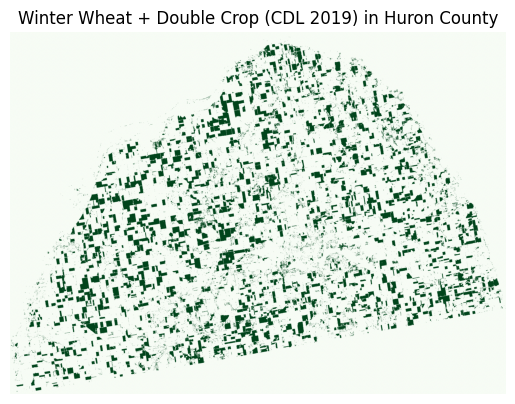

✅ Saved: huron_winter_wheat_2019.geojson

Processing 2020...


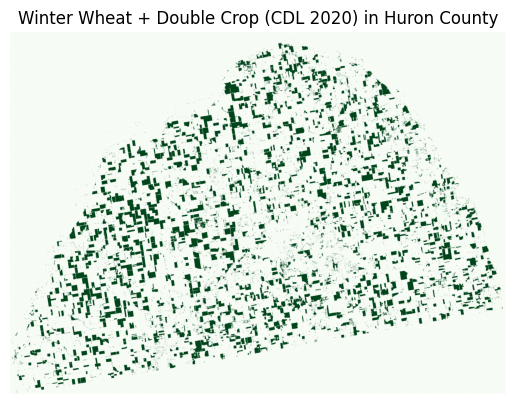

✅ Saved: huron_winter_wheat_2020.geojson

Processing 2021...


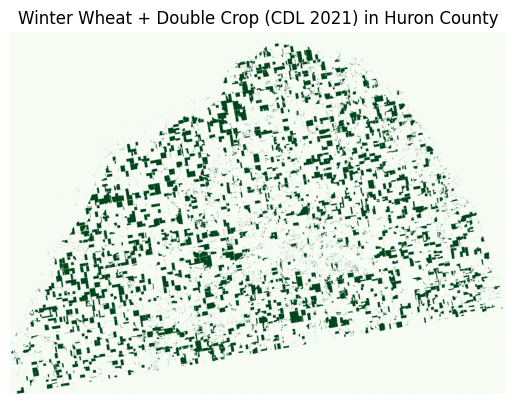

✅ Saved: huron_winter_wheat_2021.geojson

Processing 2022...


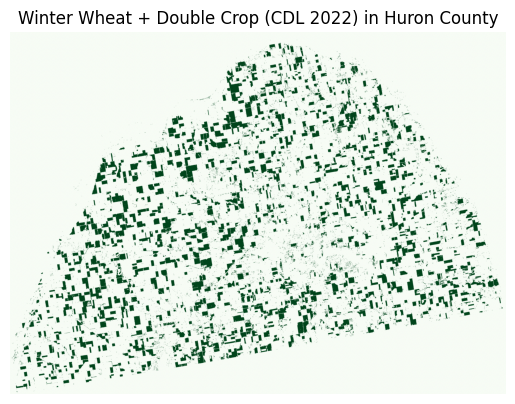

✅ Saved: huron_winter_wheat_2022.geojson

Processing 2023...


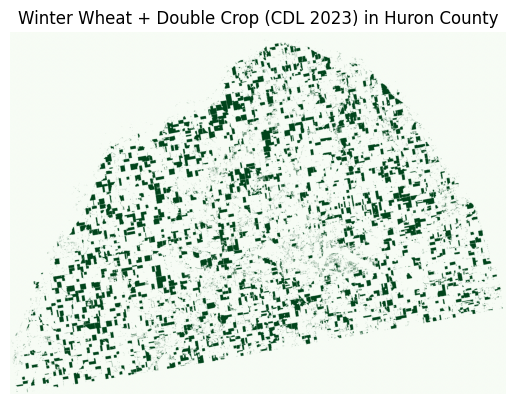

✅ Saved: huron_winter_wheat_2023.geojson

Processing 2024...


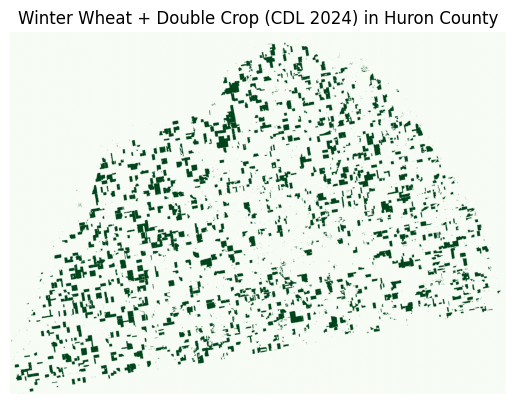

✅ Saved: huron_winter_wheat_2024.geojson


In [ ]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from rasterio.features import shapes
from shapely.geometry import shape
import numpy as np
import matplotlib.pyplot as plt
import os

# Load Huron County boundary GeoJSON
gdf = gpd.read_file('/content/huron_county.geojson')

# Years to process
years = range(2019, 2025)

# CDL class codes that correspond to winter wheat and double crops
winter_wheat_classes = [24, 26, 36]

for year in years:
    print(f"\nProcessing {year}...")

    tif_path = f"cdl_{year}/{year}_30m_cdls.tif"

    if not os.path.exists(tif_path):
        print(f"⚠️ File not found: {tif_path}")
        continue

    with rasterio.open(tif_path) as src:
        raster_crs = src.crs
        gdf_proj = gdf.to_crs(raster_crs)
        huron_geom = [feature["geometry"] for feature in gdf_proj.__geo_interface__["features"]]

        # Clip raster to Huron County
        out_image, out_transform = mask(src, huron_geom, crop=True)
        out_meta = src.meta

    # Build winter wheat mask
    cdl_huron = out_image[0]
    wheat_mask = np.isin(cdl_huron, winter_wheat_classes)

    # Plot mask
    plt.imshow(wheat_mask, cmap="Greens")
    plt.title(f"Winter Wheat + Double Crop (CDL {year}) in Huron County")
    plt.axis("off")
    plt.show()

    # Convert to polygons
    wheat_mask_uint8 = wheat_mask.astype(np.uint8)
    results = list(shapes(wheat_mask_uint8, mask=wheat_mask, transform=out_transform))
    geoms = [shape(geom) for geom, value in results if value == 1]

    wheat_gdf = gpd.GeoDataFrame(geometry=geoms, crs=out_meta["crs"])
    wheat_gdf = wheat_gdf.explode(index_parts=False).reset_index(drop=True)

    # Save as GeoJSON
    output_path = f"huron_winter_wheat_{year}.geojson"
    wheat_gdf.to_file(output_path, driver="GeoJSON")
    print(f"✅ Saved: {output_path}")


In [ ]:
import geopandas as gpd
from itertools import combinations
import os

# List of years
years = [2020, 2021, 2022, 2023, 2024]

# Load all GeoJSONs into a dictionary
geojsons = {}
for year in years:
    path = f"huron_winter_wheat_{year}.geojson"
    if os.path.exists(path):
        geojsons[year] = gpd.read_file(path).unary_union
    else:
        print(f"⚠️ File not found: {path}")

# Compute Jaccard Index for each pair of years
jaccard_results = {}
for year1 in years:
    best_score = 0
    best_match = None
    for year2 in years:
        if year1 == year2:
            continue
        inter = geojsons[year1].intersection(geojsons[year2])
        union = geojsons[year1].union(geojsons[year2])
        jaccard = inter.area / union.area if union.area > 0 else 0
        print(f"Jaccard({year1}, {year2}): {jaccard:.4f}")
        if jaccard > best_score:
            best_score = jaccard
            best_match = year2
    jaccard_results[year1] = (best_match, best_score)

# Show best match for each year
print("\n📊 Closest Match by Jaccard Index:")
for year, (match, score) in jaccard_results.items():
    print(f"{year} ↔ {match} (Jaccard = {score:.4f})")


<ipython-input-95-476bb1f96d0a>:13: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geojsons[year] = gpd.read_file(path).unary_union
<ipython-input-95-476bb1f96d0a>:13: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geojsons[year] = gpd.read_file(path).unary_union
<ipython-input-95-476bb1f96d0a>:13: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geojsons[year] = gpd.read_file(path).unary_union
<ipython-input-95-476bb1f96d0a>:13: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geojsons[year] = gpd.read_file(path).unary_union
<ipython-input-95-476bb1f96d0a>:13: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geojsons[year] = gpd.read_file(path).unary_union


Jaccard(2020, 2021): 0.1566
Jaccard(2020, 2022): 0.2016
Jaccard(2020, 2023): 0.2200
Jaccard(2020, 2024): 0.2108
Jaccard(2021, 2020): 0.1566
Jaccard(2021, 2022): 0.1603
Jaccard(2021, 2023): 0.2066
Jaccard(2021, 2024): 0.1914
Jaccard(2022, 2020): 0.2016
Jaccard(2022, 2021): 0.1603
Jaccard(2022, 2023): 0.1575
Jaccard(2022, 2024): 0.1635
Jaccard(2023, 2020): 0.2200
Jaccard(2023, 2021): 0.2066
Jaccard(2023, 2022): 0.1575
Jaccard(2023, 2024): 0.1193
Jaccard(2024, 2020): 0.2108
Jaccard(2024, 2021): 0.1914
Jaccard(2024, 2022): 0.1635
Jaccard(2024, 2023): 0.1193

📊 Closest Match by Jaccard Index:
2020 ↔ 2023 (Jaccard = 0.2200)
2021 ↔ 2023 (Jaccard = 0.2066)
2022 ↔ 2020 (Jaccard = 0.2016)
2023 ↔ 2020 (Jaccard = 0.2200)
2024 ↔ 2020 (Jaccard = 0.2108)


### Getting Remote Sensing data (Sentinel2) to work

TODO: Use NDVI to get planting date, then do GDD from then using Ag-Genius numbers.

In [ ]:
import json
from shapely.geometry import shape
from pystac_client import Client

# Step 1: Load the GeoJSON file
with open("huron_county.geojson") as f:
    geojson = json.load(f)

# Step 2: Extract the geometry (assumes single feature)
geometry = shape(geojson["features"][0]["geometry"])

# Step 3: Use as `intersects` in your STAC search
catalog = Client.open("https://earth-search.aws.element84.com/v1")

search = catalog.search(
    collections=["sentinel-2-l2a"],
    intersects=geometry,
    datetime="2023-01-01/2023-09-01",
    query={"eo:cloud_cover": {"lt": 30}},
    max_items=300

    #limit=5
)


In [ ]:
# # Step 4: Collect and inspect results
items = list(search.items())
print(f"Found {len(items)} Sentinel-2 scenes for Huron County in June 2024")


print("Available bands in first scene:")
for asset_key in items[0].assets.keys():
    print(" -", asset_key)

Found 65 Sentinel-2 scenes for Huron County in June 2024
Available bands in first scene:
 - aot
 - blue
 - coastal
 - granule_metadata
 - green
 - nir
 - nir08
 - nir09
 - red
 - rededge1
 - rededge2
 - rededge3
 - scl
 - swir16
 - swir22
 - thumbnail
 - tileinfo_metadata
 - visual
 - wvp
 - aot-jp2
 - blue-jp2
 - coastal-jp2
 - green-jp2
 - nir-jp2
 - nir08-jp2
 - nir09-jp2
 - red-jp2
 - rededge1-jp2
 - rededge2-jp2
 - rededge3-jp2
 - scl-jp2
 - swir16-jp2
 - swir22-jp2
 - visual-jp2
 - wvp-jp2


In [ ]:
from pyproj import Transformer
from shapely.ops import transform

project = Transformer.from_crs("epsg:4326", "epsg:32617", always_xy=True).transform
geometry_utm = transform(project, geometry)
minx, miny, maxx, maxy = geometry_utm.bounds


In [ ]:
stack = stackstac.stack(
    items,
    assets=["red", "nir", "scl"],
    resolution=10,
    epsg=32617,
    bounds=(minx, miny, maxx, maxy),
    dtype="float64"
)

# Select bands
red = stack.sel(band="red")
nir = stack.sel(band="nir")
scl = stack.sel(band="scl")

# Cloud mask using SCL classes:
# 1 - saturated/defective, 3 - shadows, 8–10 - clouds, 11 - snow/ice
cloud_mask = ~scl.isin([1, 3, 8, 9, 10, 11])

# Mask bad pixels
red_masked = red.where(cloud_mask)
nir_masked = nir.where(cloud_mask)

# NDVI calculation
ndvi = (nir_masked - red_masked) / (nir_masked + red_masked)
ndvi = ndvi.assign_coords(time=stack.time)
ndvi = ndvi.clip(min=-1.0, max=1.0)

In [ ]:
ndvi

<xarray.DataArray 'stackstac-e1ac4687b80f0cccf28c07b4a2d29f17' (time: 65,
                                                                y: 4358, x: 6943)> Size: 16GB
dask.array<clip, shape=(65, 4358, 6943), dtype=float64, chunksize=(1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/45)
    id                                       (time) <U24 6kB 'S2B_17TLJ_20230...
  * x                                        (x) float64 56kB 3.011e+05 ... 3...
  * y                                        (y) float64 35kB 4.881e+06 ... 4...
    s2:cloud_shadow_percentage               (time) object 520B 0 0 ... 2.038679
    s2:medium_proba_clouds_percentage        (time) float64 520B 1.297 ... 1.184
    s2:processing_baseline                   <U5 20B '05.09'
    ...                                       ...
    platform                                 (time) <U11 3kB 'sentinel-2b' .....
    created                                  (time) <U24 6kB '2023-02-01T23:1...
    s2:vegetation_percentage                 (time) float64 520B 0.005841 ......
    s2:datastrip_id                          (time) <U64 17kB 'S2B_OPER_MSI_L...
    epsg                                     int64 8B 32617
  * time                                     (time) datetime64[ns] 520B 2023-...

🗓️  Closest date to May 15, 2023: 2023-05-17


/usr/local/lib/python3.11/dist-packages/dask/_task_spec.py:745: RuntimeWarning: divide by zero encountered in divide
  return self.func(*new_argspec)
/usr/local/lib/python3.11/dist-packages/dask/_task_spec.py:745: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)


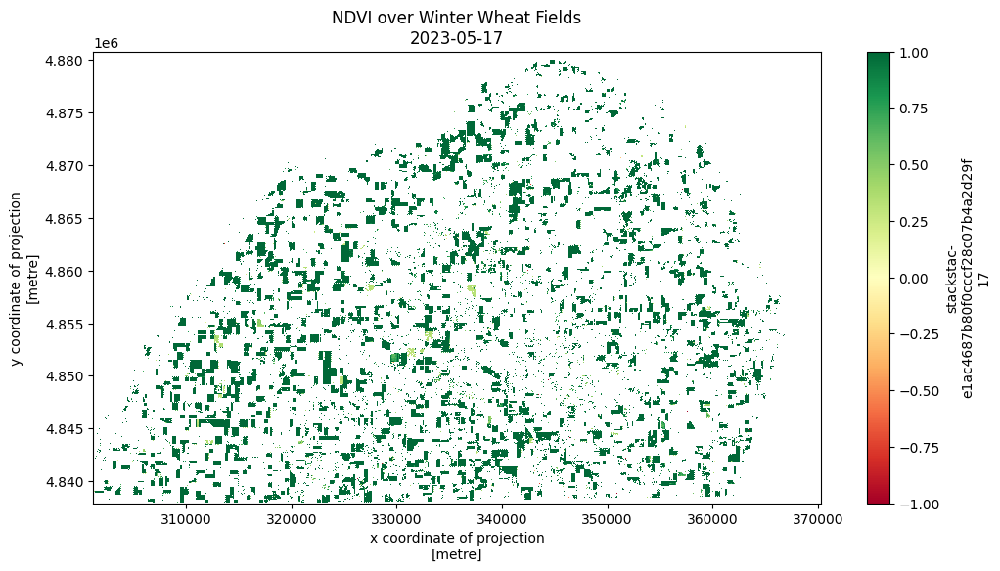

In [ ]:
import geopandas as gpd
import rioxarray
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Attach CRS if not set
ndvi.rio.write_crs("EPSG:32617", inplace=True)

# Step 2: Load and reproject winter wheat field boundaries
wheat_gdf = gpd.read_file("huron_winter_wheat_2023.geojson").to_crs("EPSG:32617")

# Step 3: Clip NDVI to wheat field polygons
ndvi_clipped = ndvi.rio.clip(wheat_gdf.geometry.values, wheat_gdf.crs, drop=True)

# Step 4: Choose a mid-May date (or nearest)
# Convert NDVI time coordinate to pandas datetime index
dates = pd.to_datetime(ndvi_clipped.time.values)
target_date = pd.Timestamp("2023-05-15")
closest_index = np.argmin(np.abs(dates - target_date))

# Step 5: Plot the chosen NDVI slice
print(f"🗓️  Closest date to May 15, 2023: {dates[closest_index].date()}")
ndvi_clipped.isel(time=closest_index).plot(
    cmap="RdYlGn", vmin=-1, vmax=1, figsize=(12, 6)
)
plt.title(f"NDVI over Winter Wheat Fields\n{dates[closest_index].date()}")
plt.show()


🗓️  Closest date to May 15, 2023: 2023-05-17


/usr/local/lib/python3.11/dist-packages/dask/_task_spec.py:745: RuntimeWarning: divide by zero encountered in divide
  return self.func(*new_argspec)
/usr/local/lib/python3.11/dist-packages/dask/_task_spec.py:745: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)


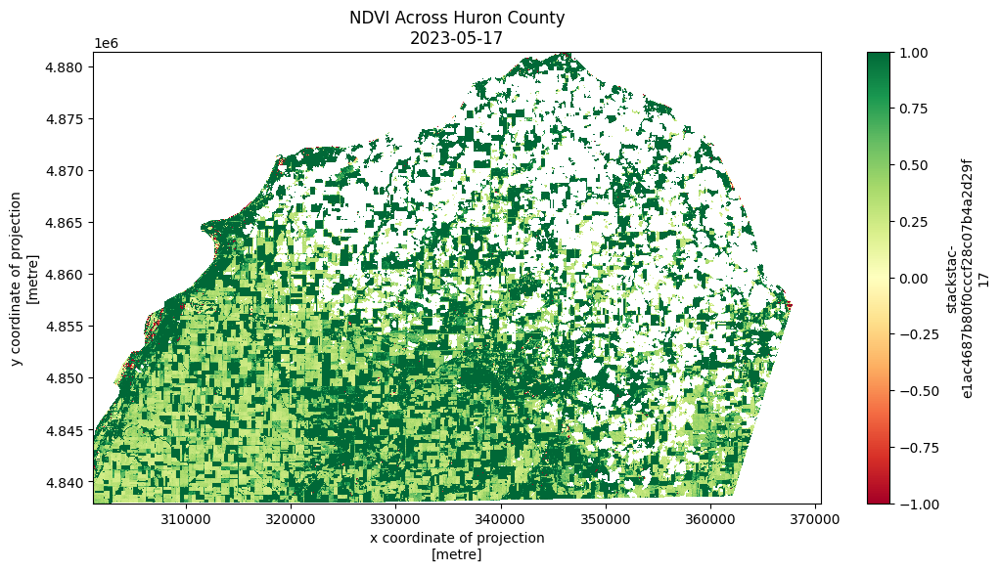

In [ ]:
import geopandas as gpd
import rioxarray
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Attach CRS to NDVI if not already set
ndvi.rio.write_crs("EPSG:32617", inplace=True)

# Step 2: Load and reproject Huron County boundary
county_gdf = gpd.read_file("huron_county.geojson").to_crs("EPSG:32617")

# Step 3: Clip NDVI to county boundary
ndvi_county = ndvi.rio.clip(county_gdf.geometry.values, county_gdf.crs, drop=True)

# Step 4: Choose a mid-May scene (or closest available)
dates = pd.to_datetime(ndvi_county.time.values)
target_date = pd.Timestamp("2023-05-15")
closest_index = np.argmin(np.abs(dates - target_date))

# Step 5: Plot the NDVI for the county
print(f"🗓️  Closest date to May 15, 2023: {dates[closest_index].date()}")
ndvi_county.isel(time=closest_index).plot(
    cmap="RdYlGn", vmin=-1, vmax=1, figsize=(12, 6)
)
plt.title(f"NDVI Across Huron County\n{dates[closest_index].date()}")
plt.show()


LAI

/usr/local/lib/python3.11/dist-packages/dask/_task_spec.py:745: RuntimeWarning: divide by zero encountered in divide
  return self.func(*new_argspec)
/usr/local/lib/python3.11/dist-packages/dask/_task_spec.py:745: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)


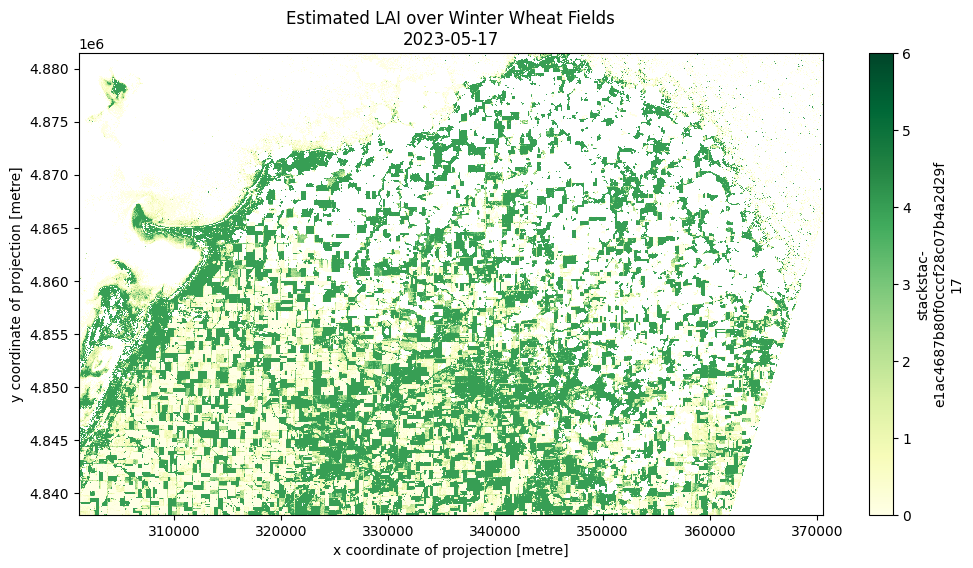

In [ ]:
# Mask NDVI values below a vegetation threshold
ndvi_clean = ndvi.where(ndvi > 0.2)  # Mask anything likely not vegetation

# Apply LAI formula
lai = 6.0 * ndvi_clean - 2.0

# Optional: Ensure no negative LAI
lai = lai.clip(min=0)


# Use same closest_index from NDVI
lai_slice = lai.isel(time=closest_index)

# Plot LAI
lai_slice.plot(cmap="YlGn", vmin=0, vmax=6, figsize=(12, 6))
plt.title(f"Estimated LAI (over all of Huron))\n{dates[closest_index].date()}")
plt.xlabel("x coordinate of projection [metre]")
plt.ylabel("y coordinate of projection [metre]")
plt.show()


#### graph a point to see if it works

UTM coordinates: 337712.6519411212, 4850304.017917534


/usr/local/lib/python3.11/dist-packages/dask/_task_spec.py:745: RuntimeWarning: divide by zero encountered in divide
  return self.func(*new_argspec)


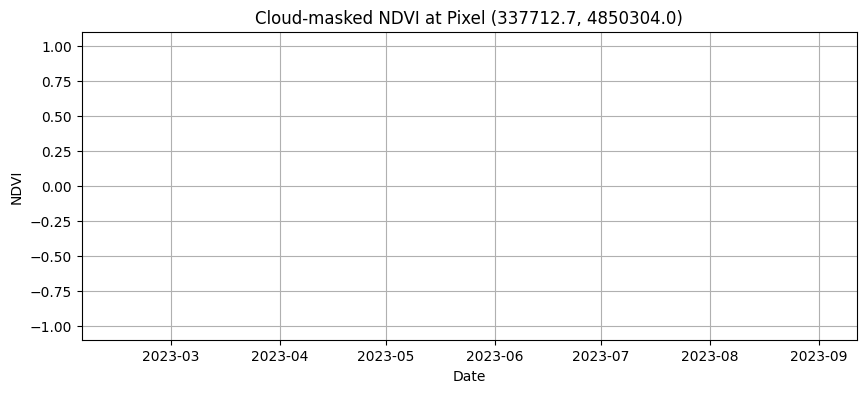

In [ ]:

import pyproj

lat, lon = 43.7880, -83.0170

# WGS84 → UTM Zone 17N
transformer = pyproj.Transformer.from_crs("epsg:4326", "epsg:32617", always_xy=True)
x_utm, y_utm = transformer.transform(lon, lat)

print(f"UTM coordinates: {x_utm}, {y_utm}")




# Pick a single pixel to visualize over time
x_coord = x_utm
y_coord = y_utm


pixel_ndvi = ndvi.sel(x=x_coord, y=y_coord, method="nearest")
pixel_ndvi_series = pixel_ndvi.to_series().reset_index()
pixel_ndvi_series.columns = ["time", "ndvi"]


# Plot NDVI over time for that pixel
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.plot(pixel_ndvi_series["time"], pixel_ndvi_series["ndvi"])
plt.title(f"Cloud-masked NDVI at Pixel ({x_coord:.1f}, {y_coord:.1f})")
plt.xlabel("Date")
plt.ylabel("NDVI")
plt.grid()
plt.show()





In [ ]:
import folium
import pyproj

# # UTM coordinates from your pixel
# x_utm = 303130.0
# y_utm = 4879490.0

# Convert from UTM (EPSG:32617) to WGS84 (EPSG:4326)
transformer = pyproj.Transformer.from_crs("epsg:32617", "epsg:4326", always_xy=True)
lon, lat = transformer.transform(x_utm, y_utm)

# Create map centered at the pixel location
m = folium.Map(location=[lat, lon], zoom_start=12)

# Add marker for the NDVI pixel
folium.Marker([lat, lon], popup=f"NDVI Pixel\nLat: {lat:.5f}, Lon: {lon:.5f}").add_to(m)

# Show map (in Jupyter or Colab)
m


### Infering Planting Date (by pixel)  [Not enough RAM]

USDA says the usual planting dates for michigan is:
1.  Start:  ~Sept 13
2.  Most Active:  Sept 22- Oct 22
3.  End:  ~Nov 1



In [ ]:
import geopandas as gpd
import pandas as pd

# Load all US counties (FIPS-encoded)
url = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
gdf = gpd.read_file(url)

# This file contains geometry but no names, so match using FIPS
huron_fips = "26063"  # 26 = Michigan, 063 = Huron County
huron_county = gdf[gdf["id"] == huron_fips]

# Save to GeoJSON
huron_county.to_file("huron_county.geojson", driver="GeoJSON")


In [ ]:
import json
from shapely.geometry import shape
from pystac_client import Client

# Step 1: Load the GeoJSON file
with open("huron_county.geojson") as f:
    geojson = json.load(f)

# Step 2: Extract the geometry (assumes single feature)
geometry = shape(geojson["features"][0]["geometry"])

# Step 3: Use as `intersects` in your STAC search
catalog = Client.open("https://earth-search.aws.element84.com/v1")

search = catalog.search(
    collections=["sentinel-2-l2a"],
    intersects=geometry,
    datetime="2023-09-03/2023-12-10",
    query={"eo:cloud_cover": {"lt": 30}},
    max_items=300

    #limit=5
)


In [ ]:
items = list(search.items())
print(f"Found {len(items)} Sentinel-2 scenes for the given search")


print("Available bands in first scene:")
for asset_key in items[0].assets.keys():
    print(" -", asset_key)

Found 21 Sentinel-2 scenes for the given search
Available bands in first scene:
 - aot
 - blue
 - coastal
 - granule_metadata
 - green
 - nir
 - nir08
 - nir09
 - red
 - rededge1
 - rededge2
 - rededge3
 - scl
 - swir16
 - swir22
 - thumbnail
 - tileinfo_metadata
 - visual
 - wvp
 - aot-jp2
 - blue-jp2
 - coastal-jp2
 - green-jp2
 - nir-jp2
 - nir08-jp2
 - nir09-jp2
 - red-jp2
 - rededge1-jp2
 - rededge2-jp2
 - rededge3-jp2
 - scl-jp2
 - swir16-jp2
 - swir22-jp2
 - visual-jp2
 - wvp-jp2


In [ ]:
from pyproj import Transformer
from shapely.ops import transform

project = Transformer.from_crs("epsg:4326", "epsg:32617", always_xy=True).transform
geometry_utm = transform(project, geometry)
minx, miny, maxx, maxy = geometry_utm.bounds


In [ ]:
import stackstac
# Stack with blue added
stack = stackstac.stack(
    items,
    assets=["blue", "red", "nir", "scl"],  # Add blue band
    resolution=10,
    epsg=32617,
    bounds=(minx, miny, maxx, maxy),
    dtype="float64"
)

# Select bands
blue = stack.sel(band="blue")
red = stack.sel(band="red")
nir = stack.sel(band="nir")
scl = stack.sel(band="scl")

# Cloud mask: 1 - saturated/defective, 3 - shadows, 8–10 - clouds, 11 - snow/ice
cloud_mask = ~scl.isin([1, 3, 8, 9, 10, 11])

# Mask bad pixels
blue_masked = blue.where(cloud_mask)
red_masked = red.where(cloud_mask)
nir_masked = nir.where(cloud_mask)

# EVI calculation
evi = 2.5 * (nir_masked - red_masked) / (
    nir_masked + 6 * red_masked - 7.5 * blue_masked + 1
)

# Add time dimension
evi = evi.assign_coords(time=stack.time)

# Optional: Clip to valid EVI range
evi = evi.clip(min=-1.0, max=1.0)


In [ ]:
import geopandas as gpd
import rioxarray

# Load wheat field boundaries for 2024
wheat_gdf = gpd.read_file("huron_winter_wheat_2024.geojson").to_crs("EPSG:32617")

# Attach CRS to EVI if not already present
evi.rio.write_crs("EPSG:32617", inplace=True)

# Clip EVI stack to just 2024 wheat field polygons
evi_clipped = evi.rio.clip(wheat_gdf.geometry.values, wheat_gdf.crs, drop=True)

In [ ]:
# Ensure EVI is time-labeled properly
dates = pd.to_datetime(evi_clipped.time.values)

# Find the closest date to Sept 28, 2023
target_date = pd.Timestamp("2023-10-10")
closest_index = np.argmin(np.abs(dates - target_date))

# Plot the EVI for that day
print(f"🗓️  Closest date to Sept 28, 2023: {dates[closest_index].date()}")
evi_clipped.isel(time=closest_index).plot(
    cmap="YlGn", vmin=-1, vmax=1, figsize=(12, 6)
)
plt.title(f"EVI over 2024 Winter Wheat Fields\n{dates[closest_index].date()}")
plt.show()

#### Threshold & Inflection

In [ ]:
import numpy as np
import xarray as xr

# How many time steps?
n_time = evi_clipped.sizes["time"]

# Get time values (for metadata later)
time_values = evi_clipped.time.values

# Create list to store each time slice
evi_list = []

# Loop through each time index
for t in range(n_time):
    print(f"Extracting time index {t+1}/{n_time}...")
    band = evi_clipped.isel(time=t)
    arr = band.values  # this safely avoids Dask compute
    evi_list.append(arr)

# Stack into final 3D NumPy array (time, y, x)
evi_clipped_stack = np.stack(evi_list, axis=0)
print("✅ EVI stack shape:", evi_clipped_stack.shape)


In [ ]:
np.save('evi_clipped_stack_2023.npy', evi_clipped_stack)

In [ ]:
import numpy as np

evi_stack = np.load("evi_clipped_stack_2023.npy")


In [ ]:
# Get y and x coordinates
y_coords = evi_clipped.y.values
x_coords = evi_clipped.x.values
time_values = evi_clipped.time.values

# Rebuild clean xarray object
evi_clean_pixel = xr.DataArray(
    data=evi_stack,
    dims=["time", "y", "x"],
    coords={"time": time_values, "y": y_coords, "x": x_coords},
    name="evi"
)


In [ ]:
import numpy as np
import xarray as xr
from scipy.signal import savgol_filter
import dask.array as da
from dask.diagnostics import ProgressBar

# Step 1: Daskify the EVI stack
evi_dask = evi_clean_pixel.chunk({"y": 512, "x": 512})  # keep time unchunked for filtering

# Step 2: Define pixel-wise planting detection function
def find_planting_day(evi_ts):
    if np.all(np.isnan(evi_ts)):
        return np.nan
    try:
        deriv2 = savgol_filter(evi_ts, window_length=7, polyorder=2, deriv=2, mode='interp')
        return np.argmax(deriv2)
    except Exception:
        return np.nan

# Step 3: Apply function across all pixels in parallel
planting_idx_map = xr.apply_ufunc(
    find_planting_day,
    evi_dask,
    input_core_dims=[["time"]],
    output_core_dims=[[]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[np.float32],
    keep_attrs=True
)

# Step 4: Convert index to datetime using global time values
time_values = evi_clean_pixel.time.values  # Extract once

def idx_to_date(idx):
    if np.isnan(idx) or not (0 <= int(idx) < len(time_values)):
        return np.datetime64("NaT")
    return time_values[int(idx)]

planting_dates = xr.apply_ufunc(
    idx_to_date,
    planting_idx_map,
    vectorize=True,
    dask="parallelized",
    output_dtypes=["datetime64[D]"],
    keep_attrs=True
)

# Step 5: Convert to days since August 31
days_since_aug31 = (
    planting_dates - np.datetime64("2023-08-31")
).astype("timedelta64[D]").astype("int16")

# Step 6: Compute result
with ProgressBar():
    planting_day_map = days_since_aug31.compute()

# Step 7: Wrap as xarray DataArray for plotting
planting_day_da = xr.DataArray(
    planting_day_map,
    dims=["y", "x"],
    coords={"y": evi_clean_pixel.y, "x": evi_clean_pixel.x},
    name="planting_days"
)

# Step 8: Plot
planting_day_da.plot(cmap="viridis", figsize=(12, 6))
import matplotlib.pyplot as plt
plt.title("Estimated Planting Days Since August 31")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


[########################################] | 100% Completed | 38m 3s


### Infering Planting Date (Downsampled by pixel 500x500m)

In [ ]:
import geopandas as gpd
import pandas as pd

# Load all US counties (FIPS-encoded)
url = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
gdf = gpd.read_file(url)

# This file contains geometry but no names, so match using FIPS
huron_fips = "26063"  # 26 = Michigan, 063 = Huron County
huron_county = gdf[gdf["id"] == huron_fips]

# Save to GeoJSON
huron_county.to_file("huron_county.geojson", driver="GeoJSON")


In [ ]:
import json
from shapely.geometry import shape
from pystac_client import Client

# Step 1: Load the GeoJSON file
with open("huron_county.geojson") as f:
    geojson = json.load(f)

# Step 2: Extract the geometry (assumes single feature)
geometry = shape(geojson["features"][0]["geometry"])

# Step 3: Use as `intersects` in your STAC search
catalog = Client.open("https://earth-search.aws.element84.com/v1")

search = catalog.search(
    collections=["sentinel-2-l2a"],
    intersects=geometry,
    datetime="2023-09-05/2023-12-10",
    query={"eo:cloud_cover": {"lt": 30}},
    max_items=300

    #limit=5
)


In [ ]:
items = list(search.items())
print(f"Found {len(items)} Sentinel-2 scenes for the given search")


print("Available bands in first scene:")
for asset_key in items[0].assets.keys():
    print(" -", asset_key)

Found 19 Sentinel-2 scenes for the given search
Available bands in first scene:
 - aot
 - blue
 - coastal
 - granule_metadata
 - green
 - nir
 - nir08
 - nir09
 - red
 - rededge1
 - rededge2
 - rededge3
 - scl
 - swir16
 - swir22
 - thumbnail
 - tileinfo_metadata
 - visual
 - wvp
 - aot-jp2
 - blue-jp2
 - coastal-jp2
 - green-jp2
 - nir-jp2
 - nir08-jp2
 - nir09-jp2
 - red-jp2
 - rededge1-jp2
 - rededge2-jp2
 - rededge3-jp2
 - scl-jp2
 - swir16-jp2
 - swir22-jp2
 - visual-jp2
 - wvp-jp2


In [ ]:
from pyproj import Transformer
from shapely.ops import transform

project = Transformer.from_crs("epsg:4326", "epsg:32617", always_xy=True).transform
geometry_utm = transform(project, geometry)
minx, miny, maxx, maxy = geometry_utm.bounds


In [ ]:
import stackstac
# Stack with blue added
stack = stackstac.stack(
    items,
    assets=["blue", "red", "nir", "scl"],  # Add blue band
    resolution=10,
    epsg=32617,
    bounds=(minx, miny, maxx, maxy),
    dtype="float64"
)

# Select bands
blue = stack.sel(band="blue")
red = stack.sel(band="red")
nir = stack.sel(band="nir")
scl = stack.sel(band="scl")

# Cloud mask: 1 - saturated/defective, 3 - shadows, 8–10 - clouds, 11 - snow/ice
cloud_mask = ~scl.isin([1, 3, 8, 9, 10, 11])

# Mask bad pixels
blue_masked = blue.where(cloud_mask)
red_masked = red.where(cloud_mask)
nir_masked = nir.where(cloud_mask)

# EVI calculation
evi = 2.5 * (nir_masked - red_masked) / (
    nir_masked + 6 * red_masked - 7.5 * blue_masked + 1
)

# Add time dimension
evi = evi.assign_coords(time=stack.time)

# Optional: Clip to valid EVI range
evi = evi.clip(min=-1.0, max=1.0)


In [ ]:
import geopandas as gpd
import rioxarray

# Load wheat field boundaries for 2024
wheat_gdf = gpd.read_file("huron_winter_wheat_2024.geojson").to_crs("EPSG:32617")

# Attach CRS to EVI if not already present
evi.rio.write_crs("EPSG:32617", inplace=True)

# Clip EVI stack to just 2024 wheat field polygons
evi_clipped = evi.rio.clip(wheat_gdf.geometry.values, wheat_gdf.crs, drop=True)

In [ ]:
evi_downsampled = evi_clipped.coarsen(x=50, y=50, boundary="trim").mean()

In [ ]:
evi_downsampled

<xarray.DataArray 'stackstac-4d6b18f976add5d17df55b75af3457f5' (time: 19,
                                                                y: 84, x: 137)> Size: 2MB
dask.array<mean_agg-aggregate, shape=(19, 84, 137), dtype=float64, chunksize=(1, 20, 20), chunktype=numpy.ndarray>
Coordinates: (12/46)
    id                                       (time) <U24 2kB 'S2A_17TLJ_20230...
  * x                                        (x) float64 1kB 3.016e+05 ... 3....
  * y                                        (y) float64 672B 4.88e+06 ... 4....
    eo:cloud_cover                           (time) float64 152B 5.239 ... 26.09
    s2:granule_id                            (time) <U62 5kB 'S2A_OPER_MSI_L2...
    updated                                  (time) <U24 2kB '2023-09-15T04:4...
    ...                                       ...
    constellation                            <U10 40B 'sentinel-2'
    earthsearch:s3_path                      (time) <U80 6kB 's3://sentinel-c...
    view:sun_elevation                       (time) float64 152B 48.35 ... 22.83
    epsg                                     int64 8B 32617
  * time                                     (time) datetime64[ns] 152B 2023-...
    spatial_ref                              int64 8B 0

🗓️  Closest date to October 10, 2023: 2023-10-06


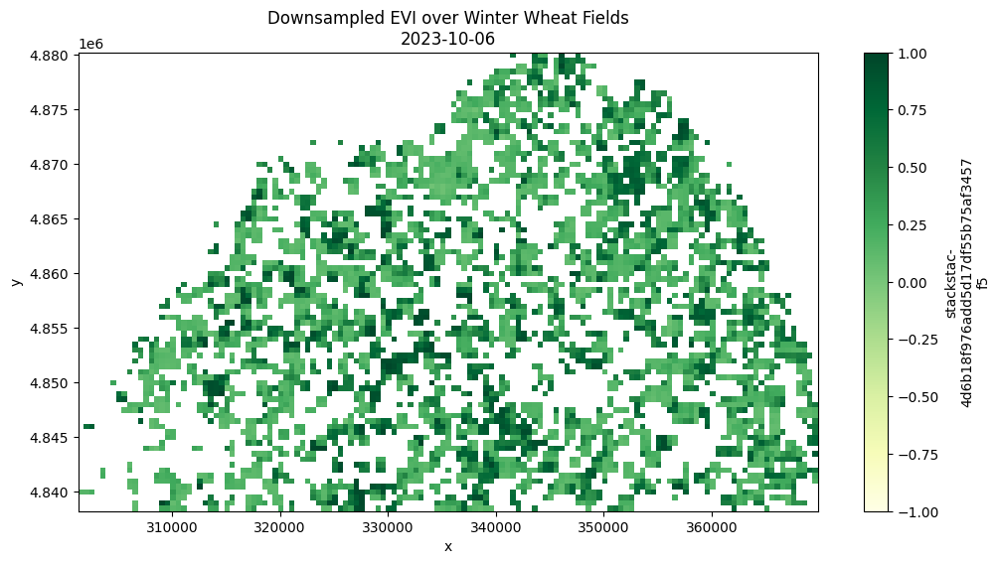

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Ensure EVI is time-labeled properly
dates = pd.to_datetime(evi_downsampled.time.values)

# Find the closest date to October 10, 2023
target_date = pd.Timestamp("2023-10-10")
closest_index = np.argmin(np.abs(dates - target_date))

# Plot the EVI for that date
print(f"🗓️  Closest date to October 10, 2023: {dates[closest_index].date()}")

evi_downsampled.isel(time=closest_index).plot(
    cmap="YlGn", vmin=-1, vmax=1, figsize=(12, 6)
)

plt.title(f"Downsampled EVI over Winter Wheat Fields\n{dates[closest_index].date()}")
plt.xlabel("x")
plt.ylabel("y")
plt.show()


In [ ]:
import numpy as np
import xarray as xr

# How many time steps?
n_time = evi_downsampled.sizes["time"]

# Get time values (for metadata later)
time_values = evi_downsampled.time.values

# Create list to store each time slice
evi_list = []

# Loop through each time index
for t in range(n_time):
    print(f"Extracting time index {t+1}/{n_time}...")
    band = evi_downsampled.isel(time=t)
    arr = band.values  # this safely avoids Dask compute
    evi_list.append(arr)

# Stack into final 3D NumPy array (time, y, x)
evi_stack = np.stack(evi_list, axis=0)
print("✅ EVI stack shape:", evi_stack.shape)


Extracting time index 1/19...
Extracting time index 2/19...
Extracting time index 3/19...
Extracting time index 4/19...
Extracting time index 5/19...
Extracting time index 6/19...
Extracting time index 7/19...
Extracting time index 8/19...
Extracting time index 9/19...
Extracting time index 10/19...
Extracting time index 11/19...
Extracting time index 12/19...
Extracting time index 13/19...
Extracting time index 14/19...
Extracting time index 15/19...
Extracting time index 16/19...
Extracting time index 17/19...
Extracting time index 18/19...


/usr/local/lib/python3.11/dist-packages/dask/_task_spec.py:745: RuntimeWarning: divide by zero encountered in divide
  return self.func(*new_argspec)


Extracting time index 19/19...
✅ EVI stack shape: (19, 84, 137)


In [ ]:
np.save('my_stack.npy', evi_stack)

In [ ]:
evi_stack=np.load('my_stack.npy')
time_values = evi_downsampled.time.values

In [ ]:
# Get y and x coordinates
y_coords = evi_downsampled.y.values
x_coords = evi_downsampled.x.values

# Rebuild clean xarray object
evi_clean = xr.DataArray(
    data=evi_stack,
    dims=["time", "y", "x"],
    coords={"time": time_values, "y": y_coords, "x": x_coords},
    name="evi"
)


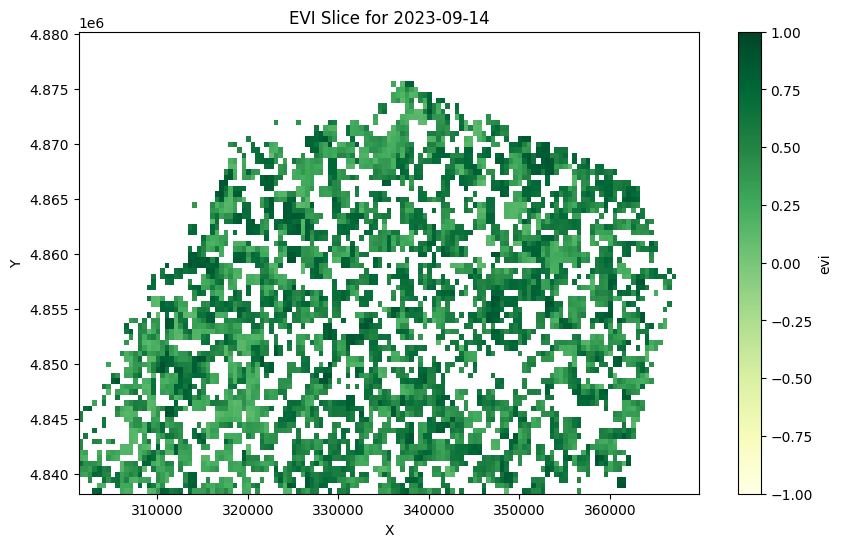

In [ ]:
import matplotlib.pyplot as plt

# Choose a time index (e.g. 0 for first date, or 5 for later)
evi_clean.isel(time=0).plot(
    cmap="YlGn",
    vmin=-1, vmax=1,
    figsize=(10, 6)
)
plt.title(f"EVI Slice for {str(evi_clean.time.values[0])[:10]}")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


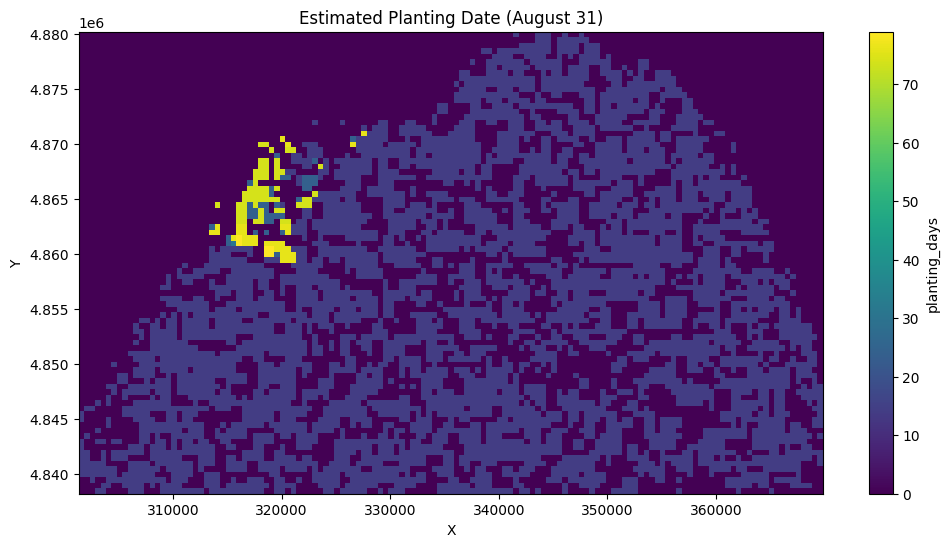

In [ ]:
import numpy as np
import xarray as xr
from scipy.signal import savgol_filter
import matplotlib.pyplot as plt

# Step 1: Unpack shape
time_len, y_len, x_len = evi_clean.shape

# Step 2: Flatten spatial dimensions for easier iteration
evi_flat = evi_clean.values.reshape(time_len, -1)  # shape: (time, y*x)

# Step 3: Allocate output for planting date indices
planting_indices = np.full(evi_flat.shape[1], np.nan)

# Step 4: Loop through each pixel's time series
for i in range(evi_flat.shape[1]):
    evi_ts = evi_flat[:, i]
    if np.all(np.isnan(evi_ts)):
        continue
    try:
        smoothed = savgol_filter(evi_ts, window_length=7, polyorder=2, mode='interp')
        second_deriv = savgol_filter(evi_ts, window_length=7, polyorder=2, deriv=2, mode='interp')
        planting_indices[i] = np.argmax(second_deriv)
    except:
        pass  # Leave as NaN if filtering fails

# Step 5: Reshape back to 2D
planting_index_2d = planting_indices.reshape(y_len, x_len)

# Step 6: Mask out invalid indices
time_values = evi_clean.time.values
valid_mask = (
    (~np.isnan(planting_index_2d)) &
    (planting_index_2d >= 0) &
    (planting_index_2d < len(time_values))
)

# Step 7: Convert valid indices to dates
planting_dates = np.full((y_len, x_len), np.datetime64("NaT"), dtype="datetime64[D]")
planting_dates[valid_mask] = time_values[planting_index_2d[valid_mask].astype(int)]

# Step 8: Convert planting dates to days since Jan 1
days_since_jan1 = (
    planting_dates - np.datetime64("2023-08-31")
).astype("timedelta64[D]").astype("int16")

# Step 9: Wrap as xarray DataArray
planting_day_map = xr.DataArray(
    data=days_since_jan1,
    dims=["y", "x"],
    coords={"y": evi_clean.y, "x": evi_clean.x},
    name="planting_days"
)

# Step 10: Plot
planting_day_map.plot(cmap="viridis", figsize=(12, 6))
plt.title("Estimated Planting Date (August 31)")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


In [ ]:
planting_no_zeroes = planting_day_map.where(planting_day_map > 0)

# planting_no_zeroes=planting_no_zeroes.where(planting_no_zeroes<22)



mean_day = planting_no_zeroes.mean().item()
median_day = planting_no_zeroes.median().item()
std_day = planting_no_zeroes.std().item()
min_day = planting_no_zeroes.min().item()
max_day = planting_no_zeroes.max().item()


from scipy import stats

# Flatten, drop NaNs
flattened = planting_no_zeroes.values.flatten()
flattened = flattened[~np.isnan(flattened)]

mode_day = stats.mode(flattened, nan_policy='omit', keepdims=False).mode


print(f"Planting Date Stats (Days Since Aug 31):")
print(f"  Mean   : {mean_day:.1f}")
print(f"  Median : {median_day}")
print(f"  Mode   : {mode_day}")
print(f"  StdDev : {std_day:.1f}")
print(f"  Min    : {min_day}")
print(f"  Max    : {max_day}")


Planting Date Stats (Days Since Aug 31):
  Mean   : 15.3
  Median : 14.0
  Mode   : 14.0
  StdDev : 8.5
  Min    : 14.0
  Max    : 79.0


<ipython-input-22-bfeefaf4c17e>:22: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
<ipython-input-22-bfeefaf4c17e>:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


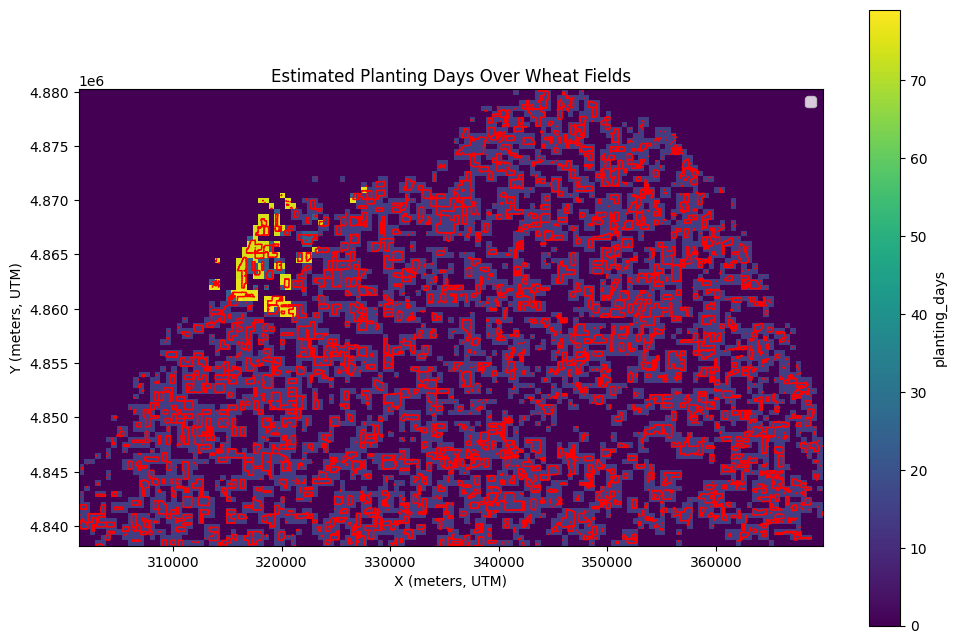

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Step 1: Load and reproject the wheat GeoJSON
wheat_gdf = gpd.read_file("/content/huron_winter_wheat_2024.geojson")
wheat_gdf = wheat_gdf.to_crs("EPSG:32617")  # match UTM

# Step 2: Plot with xarray background
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the planting days
planting_day_map.plot(ax=ax, cmap="viridis", cbar_kwargs={'label': 'planting_days'}, add_labels=False)

# Plot the wheat polygons
wheat_gdf.plot(ax=ax, facecolor="none", edgecolor="red", linewidth=1.0, label="Wheat Fields")

# Format
ax.set_title("Estimated Planting Days Over Wheat Fields")
ax.set_xlabel("X (meters, UTM)")
ax.set_ylabel("Y (meters, UTM)")
ax.legend()
plt.show()


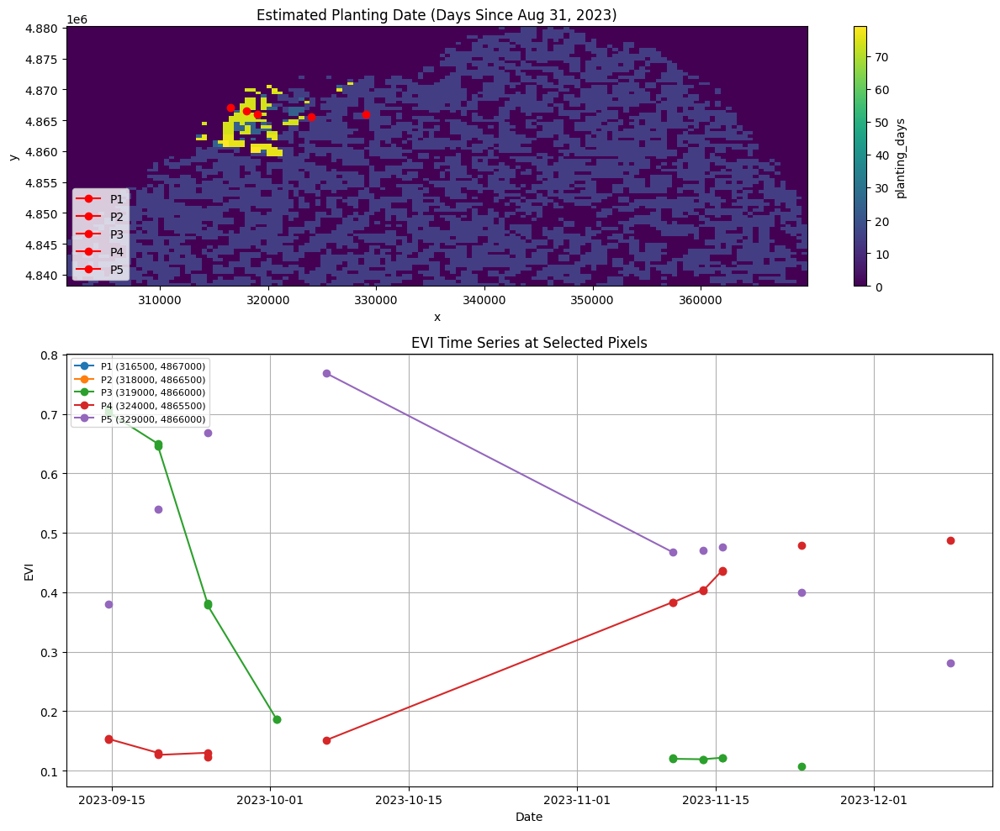

In [ ]:
import matplotlib.pyplot as plt

# Define UTM coordinates of the selected pixels
coords = [
    (316500, 4867000),  # Yellow
    (318000, 4866500),  # Yellow
    (319000, 4866000),  # Yellow
    (324000, 4865500),  # Purple
    (329000, 4866000),  # Purple
]

# Create subplots: 1 for planting_day_map with points, 1 for EVI time series
fig, axes = plt.subplots(2, 1, figsize=(12, 10), gridspec_kw={"height_ratios": [1.2, 2]})

# --- Subplot 1: Planting day map with pixel markers ---
planting_day_map.plot(
    ax=axes[0],
    cmap="viridis",
    add_colorbar=True,
    vmin=planting_day_map.min(),
    vmax=planting_day_map.max()
)
axes[0].set_title("Estimated Planting Date (Days Since Aug 31, 2023)")

# Overlay the pixel coordinates
for i, (x, y) in enumerate(coords):
    axes[0].plot(x, y, marker="o", markersize=6, color="red", label=f"P{i+1}")

axes[0].legend(loc="lower left")

# --- Subplot 2: EVI time series for each selected pixel ---
for i, (x, y) in enumerate(coords):
    # Select time series from evi_clean
    ts = evi_clean.sel(x=x, y=y, method="nearest")
    axes[1].plot(ts.time.values, ts.values, label=f"P{i+1} ({x}, {y})", marker="o")

axes[1].set_title("EVI Time Series at Selected Pixels")
axes[1].set_xlabel("Date")
axes[1].set_ylabel("EVI")
axes[1].grid(True)
axes[1].legend(loc="upper left", fontsize=8)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np

# Step 1: Mask out outliers > 40 and compute median
# median_value = planting_day_map.where(planting_day_map <= 30).median().item()

# Step 2: Replace all values > 40 with the median
no_skew_planting = planting_day_map.where(planting_day_map <= 22, other=14)


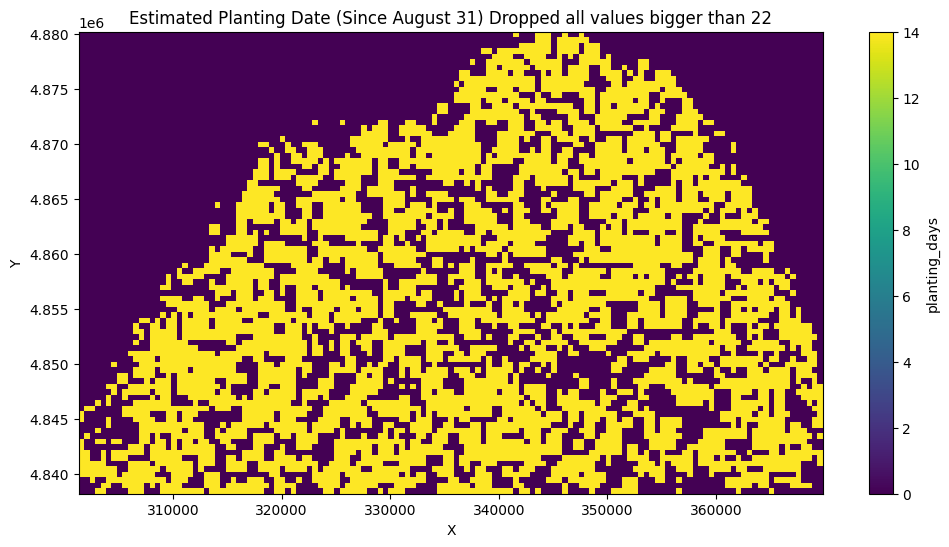

In [ ]:
# Step 10: Plot
no_skew_planting.plot(cmap="viridis", figsize=(12, 6))
plt.title("Estimated Planting Date (Since August 31) Dropped all values bigger than 22")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


Text(0.5, 1.0, 'Number of Valid EVI Observations')

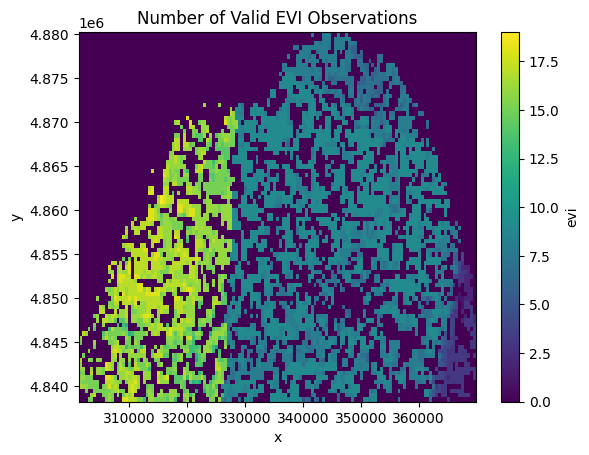

In [ ]:
valid_counts = evi_clean.notnull().sum(dim="time")
valid_counts.plot(cmap="viridis")
plt.title("Number of Valid EVI Observations")

#### Using NDWI [SAME RESULTS]

In [ ]:
import stackstac

# Step 1: Stack with additional SWIR band (B11 for NDWI)
stack = stackstac.stack(
    items,
    assets=["blue", "red", "nir", "scl", "swir16"],  # Add B11 as 'swir16'
    resolution=10,
    epsg=32617,
    bounds=(minx, miny, maxx, maxy),
    dtype="float64"
)

# Step 2: Select bands
blue = stack.sel(band="blue")
red = stack.sel(band="red")
nir = stack.sel(band="nir")
swir = stack.sel(band="swir16")  # SWIR (Band 11)
scl = stack.sel(band="scl")

# Step 3: Cloud mask (same as before)
cloud_mask = ~scl.isin([1, 3, 8, 9, 10, 11])

# Step 4: Apply cloud mask
blue_masked = blue.where(cloud_mask)
red_masked = red.where(cloud_mask)
nir_masked = nir.where(cloud_mask)
swir_masked = swir.where(cloud_mask)

# Step 5: EVI calculation
evi = 2.5 * (nir_masked - red_masked) / (
    nir_masked + 6 * red_masked - 7.5 * blue_masked + 1
)
evi = evi.assign_coords(time=stack.time)
evi = evi.clip(min=-1.0, max=1.0)

# Step 6: NDWI calculation
ndwi = (nir_masked - swir_masked) / (nir_masked + swir_masked)
ndwi = ndwi.assign_coords(time=stack.time)

# Step 7: Water mask (NDWI > 0.3 = likely water)
water_mask = ndwi > 0.3

# Optional: mask only persistent water (flagged >2 times)
persistent_water_mask = water_mask.sum(dim="time") > 2

# Step 8: Mask EVI using water mask
evi_masked = evi.where(~persistent_water_mask)


In [ ]:
import geopandas as gpd
import rioxarray

# Load wheat field boundaries for 2024
wheat_gdf = gpd.read_file("huron_winter_wheat_2024.geojson").to_crs("EPSG:32617")

# Attach CRS to EVI if not already present
evi_masked.rio.write_crs("EPSG:32617", inplace=True)

# Clip EVI stack to just 2024 wheat field polygons
evi_clipped_ndwi = evi_masked.rio.clip(wheat_gdf.geometry.values, wheat_gdf.crs, drop=True)

In [ ]:
evi_downsampled_ndwi = evi_clipped_ndwi.coarsen(x=50, y=50, boundary="trim").mean()

In [ ]:
evi_downsampled_ndwi

<xarray.DataArray 'stackstac-8f0b3140ab51dc70a91a37aa052f2e35' (time: 19,
                                                                y: 84, x: 137)> Size: 2MB
dask.array<mean_agg-aggregate, shape=(19, 84, 137), dtype=float64, chunksize=(1, 20, 20), chunktype=numpy.ndarray>
Coordinates: (12/46)
    id                                       (time) <U24 2kB 'S2A_17TLJ_20230...
  * x                                        (x) float64 1kB 3.016e+05 ... 3....
  * y                                        (y) float64 672B 4.88e+06 ... 4....
    earthsearch:boa_offset_applied           bool 1B True
    s2:processing_baseline                   <U5 20B '05.09'
    s2:thin_cirrus_percentage                (time) float64 152B 0.006718 ......
    ...                                       ...
    earthsearch:s3_path                      (time) <U80 6kB 's3://sentinel-c...
    s2:saturated_defective_pixel_percentage  int64 8B 0
    s2:not_vegetated_percentage              (time) float64 152B 8.487 ... 35.98
    epsg                                     int64 8B 32617
  * time                                     (time) datetime64[ns] 152B 2023-...
    spatial_ref                              int64 8B 0

In [ ]:
import numpy as np
import xarray as xr

# How many time steps?
n_time = evi_downsampled_ndwi.sizes["time"]

# Get time values (for metadata later)
time_values = evi_downsampled_ndwi.time.values

# Create list to store each time slice
evi_list = []

# Loop through each time index
for t in range(n_time):
    print(f"Extracting time index {t+1}/{n_time}...")
    band = evi_downsampled_ndwi.isel(time=t)
    arr = band.values  # this safely avoids Dask compute
    evi_list.append(arr)

# Stack into final 3D NumPy array (time, y, x)
evi_stack_ndwi = np.stack(evi_list, axis=0)
print("✅ EVI-NDWI stack shape:", evi_stack_ndwi.shape)


Extracting time index 1/19...
Extracting time index 2/19...
Extracting time index 3/19...
Extracting time index 4/19...
Extracting time index 5/19...
Extracting time index 6/19...
Extracting time index 7/19...
Extracting time index 8/19...
Extracting time index 9/19...
Extracting time index 10/19...
Extracting time index 11/19...
Extracting time index 12/19...
Extracting time index 13/19...
Extracting time index 14/19...
Extracting time index 15/19...
Extracting time index 16/19...
Extracting time index 17/19...
Extracting time index 18/19...
Extracting time index 19/19...
✅ EVI-NDWI stack shape: (19, 84, 137)


In [ ]:
np.save('ndwi-stack.npy', evi_stack_ndwi)

In [ ]:
# Get y and x coordinates
y_coords = evi_downsampled_ndwi.y.values
x_coords = evi_downsampled_ndwi.x.values

# Rebuild clean xarray object
evi_clean_ndwi = xr.DataArray(
    data=evi_stack_ndwi,
    dims=["time", "y", "x"],
    coords={"time": time_values, "y": y_coords, "x": x_coords},
    name="evi"
)


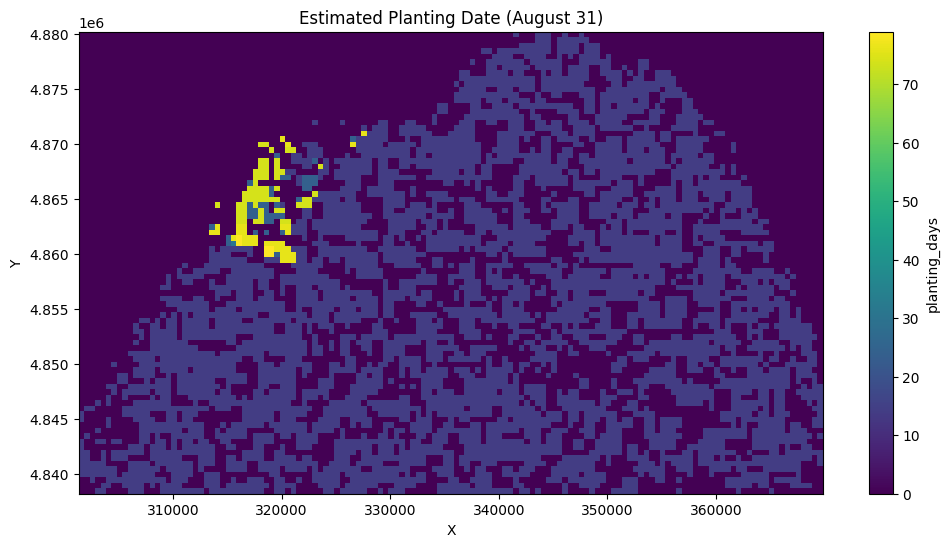

In [ ]:
import numpy as np
import xarray as xr
from scipy.signal import savgol_filter
import matplotlib.pyplot as plt

# Step 1: Unpack shape
time_len, y_len, x_len = evi_clean.shape

# Step 2: Flatten spatial dimensions for easier iteration
evi_flat = evi_clean.values.reshape(time_len, -1)  # shape: (time, y*x)

# Step 3: Allocate output for planting date indices
planting_indices = np.full(evi_flat.shape[1], np.nan)

# Step 4: Loop through each pixel's time series
for i in range(evi_flat.shape[1]):
    evi_ts = evi_flat[:, i]
    if np.all(np.isnan(evi_ts)):
        continue
    try:
        smoothed = savgol_filter(evi_ts, window_length=7, polyorder=2, mode='interp')
        second_deriv = savgol_filter(evi_ts, window_length=7, polyorder=2, deriv=2, mode='interp')
        planting_indices[i] = np.argmax(second_deriv)
    except:
        pass  # Leave as NaN if filtering fails

# Step 5: Reshape back to 2D
planting_index_2d = planting_indices.reshape(y_len, x_len)

# Step 6: Mask out invalid indices
time_values = evi_clean.time.values
valid_mask = (
    (~np.isnan(planting_index_2d)) &
    (planting_index_2d >= 0) &
    (planting_index_2d < len(time_values))
)

# Step 7: Convert valid indices to dates
planting_dates = np.full((y_len, x_len), np.datetime64("NaT"), dtype="datetime64[D]")
planting_dates[valid_mask] = time_values[planting_index_2d[valid_mask].astype(int)]

# Step 8: Convert planting dates to days since Jan 1
days_since_jan1 = (
    planting_dates - np.datetime64("2023-08-31")
).astype("timedelta64[D]").astype("int16")

# Step 9: Wrap as xarray DataArray
planting_day_map = xr.DataArray(
    data=days_since_jan1,
    dims=["y", "x"],
    coords={"y": evi_clean.y, "x": evi_clean.x},
    name="planting_days"
)

# Step 10: Plot
planting_day_map.plot(cmap="viridis", figsize=(12, 6))
plt.title("Estimated Planting Date (August 31)")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


### Using Infered Planting date in GDD (Vernalization?)

Things to consider:
* vernalization
* Perhaps using EVI to see spring greenup and then do GDD from there

In [ ]:
#Get estimated planting date
base_date = np.datetime64("2023-08-31")
estimated_date = base_date + np.timedelta64(int(median_day), "D")
print(pd.Timestamp(estimated_date).date())

#how long we think the season is
season_length=340


2023-09-14


#### download temp data

In [ ]:
import requests
import pandas as pd
import io
import os
from calendar import monthrange

def download_nclimgrid_county(var, start_year=2023, end_year=2025, save_folder="noaa_data"):
    os.makedirs(save_folder, exist_ok=True)
    base_url = "https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages"
    all_dfs = []

    for year in range(start_year, end_year + 1):
        for month in range(1, 13):
            if year == 2025 and month > 4:
                break  # Stop after April 2025

            ym = f"{year}{month:02d}"
            url = f"{base_url}/{year}/{var}-{ym}-cty-scaled.csv"
            print(f"📥 Downloading {url}")
            try:
                r = requests.get(url)
                r.raise_for_status()

                # Read CSV with no header
                df = pd.read_csv(io.StringIO(r.text), header=None)

                # Drop columns with any -999.99
                df = df.loc[:, ~(df == -999.99).any()]

                # Figure out how many days in the month
                days_in_month = monthrange(year, month)[1]

                # Assign column names
                col_names = ['index', 'level', 'fips', 'year', 'month', 'obs']
                day_columns = [str(day) for day in range(1, days_in_month + 1)]
                df.columns = col_names + day_columns

                # Reshape to long format
                df_long = df.melt(
                    id_vars=['level', 'fips', 'year', 'month', 'obs'],
                    value_vars=day_columns,
                    var_name='day',
                    value_name=var
                )

                # Convert to datetime
                df_long['day'] = df_long['day'].astype(int)
                df_long['date'] = pd.to_datetime(dict(
                    year=df_long['year'],
                    month=df_long['month'],
                    day=df_long['day']
                ))

                # ✅ Convert Celsius to Fahrenheit
                df_long[var] = df_long[var] * 9 / 5 + 32

                # Optional: Keep only relevant columns
                df_long = df_long[['fips', 'level', 'obs', 'date', var]]

                all_dfs.append(df_long)

                # Save raw CSV
                with open(f"{save_folder}/{var}-{ym}-cty-scaled.csv", "w") as f:
                    f.write(r.text)

            except requests.HTTPError as e:
                print(f"⚠️ Failed to download {url}: {e}")

    # Combine all monthly long-format data
    combined_df = pd.concat(all_dfs, ignore_index=True)
    return combined_df

# 🔁 Download & convert both Tmin and Tmax
tmin_df = download_nclimgrid_county("tmin")
tmax_df = download_nclimgrid_county("tmax")

# 💾 Save final long-format CSVs
tmin_df.to_csv("tmin_county_2023_2025_long.csv", index=False)
tmax_df.to_csv("tmax_county_2023_2025_long.csv", index=False)

print("✅ Download, reshaping, and Fahrenheit conversion complete.")


📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202301-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202302-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202303-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202304-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202305-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202306-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202307-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202308-cty-scaled.csv
📥 Downloading https://www.ncei.noaa.gov/pub/data/daily-grids/v1-0-0/averages/2023/tmin-202309-cty-scaled.csv
📥 Downloading https

In [ ]:
#convert them to polars
tmax=pl.DataFrame(tmax_df)
tmax=tmax.select(['level','date','tmax','fips'])
tmin=pl.DataFrame(tmin_df)
tmin=tmin.select(['level','date','tmin','fips'])

temp_df=tmax.join(tmin,on=['level','date','fips'])
temp_df=temp_df.sort(['level','date'])


#### GDD calc

In [ ]:
huron_df=temp_df.filter(
    pl.col('fips')=='MI: Huron County'
)
huron_df=huron_df.with_columns(
    pl.when((pl.col('date')>=pl.lit(estimated_date)) & (pl.col('date')<= (pl.lit(estimated_date)+ np.timedelta64(int(season_length), "D"))))
    .then(1)
    .otherwise(0)
    .alias('planting2023')
)
huron_df

level,date,tmax,fips,tmin,planting2023
i64,datetime[ns],f64,str,f64,i32
20063,2023-01-01 00:00:00,41.234,"""MI: Huron County""",32.936,0
20063,2023-01-02 00:00:00,40.496,"""MI: Huron County""",33.674,0
20063,2023-01-03 00:00:00,38.84,"""MI: Huron County""",33.512,0
20063,2023-01-04 00:00:00,40.172,"""MI: Huron County""",36.788,0
20063,2023-01-05 00:00:00,42.944,"""MI: Huron County""",36.302,0
…,…,…,…,…,…
20063,2025-04-26 00:00:00,67.1,"""MI: Huron County""",43.106,0
20063,2025-04-27 00:00:00,52.772,"""MI: Huron County""",35.834,0
20063,2025-04-28 00:00:00,61.88,"""MI: Huron County""",36.734,0


In [ ]:
huron_df = huron_df.with_columns(
    pl.when(pl.col("tmin") > 86)
      .then(86)
    .when(pl.col("tmin") < 32)
      .then(32)
    .otherwise(pl.col("tmin"))
    .alias("gdd_min")
)

huron_df = huron_df.with_columns(
    pl.when(pl.col("tmax") < 32)
      .then(32)
    .when(pl.col("tmax") > 86)
      .then(86)
    .otherwise(pl.col("tmax"))
    .alias("gdd_max")
)


huron_df=huron_df.with_columns(
    (((pl.col('gdd_max')+pl.col('gdd_min'))/pl.lit(2))-pl.lit(32))
    .alias('GDU')
)


huron_df=huron_df.with_columns(
    (pl.col('GDU').cum_sum().over(['planting2023']))
    .alias('AGDD')
)


huron_df = huron_df.with_columns([
    # String label for growth stage
    pl.when(pl.col("AGDD") <= 0).then(pl.lit("Pre-Emergence"))
     .when(pl.col("AGDD") <= 150).then(pl.lit("Emergence"))
     .when(pl.col("AGDD") <= 800).then(pl.lit("Jointing"))
     .when(pl.col("AGDD") <= 1200).then(pl.lit("Heading"))
     .when(pl.col("AGDD") <= 1350).then(pl.lit("Flowering"))
     .when(pl.col("AGDD") <= 2050).then(pl.lit("Maturity"))
     .otherwise(pl.lit("Post-Maturity"))
     .alias("growth_stage"),

    # Numeric growth stage value
    pl.when(pl.col("AGDD") <= 0).then(pl.lit(0))
     .when(pl.col("AGDD") <= 150).then(pl.lit(1))
     .when(pl.col("AGDD") <= 800).then(pl.lit(2))
     .when(pl.col("AGDD") <= 1200).then(pl.lit(3))
     .when(pl.col("AGDD") <= 1350).then(pl.lit(4))
     .when(pl.col("AGDD") <= 2050).then(pl.lit(5))
     .otherwise(pl.lit(6))
     .alias("growth_stage_num")
])



#chatgpt's growth stages

huron_df = huron_df.with_columns([
    # String labels for alt stages
    pl.when(pl.col("AGDD") < 100).then(pl.lit("Pre-Emergence"))
     .when(pl.col("AGDD") < 150).then(pl.lit("Emergence"))
     .when(pl.col("AGDD") < 600).then(pl.lit("Tillering"))
     .when(pl.col("AGDD") < 900).then(pl.lit("Jointing"))
     .when(pl.col("AGDD") < 1100).then(pl.lit("Booting"))
     .when(pl.col("AGDD") < 1300).then(pl.lit("Heading"))
     .when(pl.col("AGDD") < 1500).then(pl.lit("Flowering"))
     .when(pl.col("AGDD") < 1800).then(pl.lit("Milk"))
     .when(pl.col("AGDD") < 2000).then(pl.lit("Dough"))
     .when(pl.col("AGDD") < 2200).then(pl.lit("Maturity"))
     .otherwise(pl.lit("Post-Maturity"))
     .alias("growth_stage_alt"),

    # Numeric codes
    pl.when(pl.col("AGDD") < 100).then(pl.lit(0))
     .when(pl.col("AGDD") < 150).then(pl.lit(1))
     .when(pl.col("AGDD") < 600).then(pl.lit(2))
     .when(pl.col("AGDD") < 900).then(pl.lit(3))
     .when(pl.col("AGDD") < 1100).then(pl.lit(4))
     .when(pl.col("AGDD") < 1300).then(pl.lit(5))
     .when(pl.col("AGDD") < 1500).then(pl.lit(6))
     .when(pl.col("AGDD") < 1800).then(pl.lit(7))
     .when(pl.col("AGDD") < 2000).then(pl.lit(8))
     .when(pl.col("AGDD") < 2200).then(pl.lit(9))
     .otherwise(pl.lit(10))
     .alias("growth_stage_alt_num")
])


#NDGDD, I think this is for spring wheat but i threw it in just to compare
#i would need to change my GDD logic for htis

# huron_df = huron_df.with_columns([
#     # Stage labels
#     pl.when(pl.col("AGDD") < 180).then(pl.lit("Planting"))
#      .when(pl.col("AGDD") < 252).then(pl.lit("Emergence"))
#      .when(pl.col("AGDD") < 395).then(pl.lit("Leaf 1"))
#      .when(pl.col("AGDD") < 538).then(pl.lit("Leaf 2"))
#      .when(pl.col("AGDD") < 681).then(pl.lit("Leaf 3 / Tillers Begin"))
#      .when(pl.col("AGDD") < 824).then(pl.lit("Leaf 4"))
#      .when(pl.col("AGDD") < 967).then(pl.lit("Leaf 5 / Tillering Ends"))
#      .when(pl.col("AGDD") < 1110).then(pl.lit("Leaf 6 / Tillering Ends"))
#      .when(pl.col("AGDD") < 1181).then(pl.lit("Leaf 7"))
#      .when(pl.col("AGDD") < 1255).then(pl.lit("Flag Leaf Visible"))
#      .when(pl.col("AGDD") < 1396).then(pl.lit("Flag Leaf Emerged"))
#      .when(pl.col("AGDD") < 1539).then(pl.lit("Boot Swelling"))
#      .when(pl.col("AGDD") < 1567).then(pl.lit("Boot Completed"))
#      .when(pl.col("AGDD") < 1682).then(pl.lit("Heading Begins"))
#      .when(pl.col("AGDD") < 1739).then(pl.lit("Headed"))
#      .when(pl.col("AGDD") < 1768).then(pl.lit("Flowering Begins"))
#      .when(pl.col("AGDD") < 1825).then(pl.lit("Flowering Completed"))
#      .otherwise(pl.lit("Kernel Watery Ripe"))
#      .alias("ndgdd_stage"),

#     # Numeric stage codes (same breakpoints, just numbers)
#     pl.when(pl.col("AGDD") < 180).then(pl.lit(0.0))
#      .when(pl.col("AGDD") < 252).then(pl.lit(0.5))
#      .when(pl.col("AGDD") < 395).then(pl.lit(1.0))
#      .when(pl.col("AGDD") < 538).then(pl.lit(2.0))
#      .when(pl.col("AGDD") < 681).then(pl.lit(3.0))
#      .when(pl.col("AGDD") < 824).then(pl.lit(4.0))
#      .when(pl.col("AGDD") < 967).then(pl.lit(5.0))
#      .when(pl.col("AGDD") < 1110).then(pl.lit(6.0))
#      .when(pl.col("AGDD") < 1181).then(pl.lit(7.0))
#      .when(pl.col("AGDD") < 1255).then(pl.lit(7.5))
#      .when(pl.col("AGDD") < 1396).then(pl.lit(8.0))
#      .when(pl.col("AGDD") < 1539).then(pl.lit(9.0))
#      .when(pl.col("AGDD") < 1567).then(pl.lit(10.0))
#      .when(pl.col("AGDD") < 1682).then(pl.lit(10.2))
#      .when(pl.col("AGDD") < 1739).then(pl.lit(11.0))
#      .when(pl.col("AGDD") < 1768).then(pl.lit(11.4))
#      .when(pl.col("AGDD") < 1825).then(pl.lit(11.6))
#      .otherwise(pl.lit(12.0))
#      .alias("ndgdd_stage_num_haun")
# ])



huron_df.filter(
  (pl.col('growth_stage_alt_num')==2) &(pl.col('planting2023')==1)

)





level,date,tmax,fips,tmin,planting2023,gdd_min,gdd_max,GDU,season_end,AGDD,growth_stage,growth_stage_num,growth_stage_alt,growth_stage_alt_num,ndgdd_stage,ndgdd_stage_num_haun
i64,datetime[ns],f64,str,f64,i32,f64,f64,f64,bool,f64,str,i32,str,i32,str,f64
20063,2023-09-19 00:00:00,65.678,"""MI: Huron County""",46.652,1,46.652,65.678,24.165,false,159.867,"""Jointing""",2,"""Tillering""",2,"""Planting""",0.0
20063,2023-09-20 00:00:00,67.244,"""MI: Huron County""",46.238,1,46.238,67.244,24.741,false,184.608,"""Jointing""",2,"""Tillering""",2,"""Emergence""",0.5
20063,2023-09-21 00:00:00,73.544,"""MI: Huron County""",55.796,1,55.796,73.544,32.67,false,217.278,"""Jointing""",2,"""Tillering""",2,"""Emergence""",0.5
20063,2023-09-22 00:00:00,79.142,"""MI: Huron County""",58.01,1,58.01,79.142,36.576,false,253.854,"""Jointing""",2,"""Tillering""",2,"""Leaf 1""",1.0
20063,2023-09-23 00:00:00,77.81,"""MI: Huron County""",50.918,1,50.918,77.81,32.364,false,286.218,"""Jointing""",2,"""Tillering""",2,"""Leaf 1""",1.0
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
20063,2023-09-28 00:00:00,65.696,"""MI: Huron County""",57.128,1,57.128,65.696,29.412,false,441.819,"""Jointing""",2,"""Tillering""",2,"""Leaf 2""",2.0
20063,2023-09-29 00:00:00,66.038,"""MI: Huron County""",56.102,1,56.102,66.038,29.07,false,470.889,"""Jointing""",2,"""Tillering""",2,"""Leaf 2""",2.0
20063,2023-09-30 00:00:00,69.872,"""MI: Huron County""",52.304,1,52.304,69.872,29.088,false,499.977,"""Jointing""",2,"""Tillering""",2,"""Leaf 2""",2.0


Vernalization

In [ ]:
####################################################
#VERNALIZATION

# Step 1: Estimate daily average temperature
huron_df = huron_df.with_columns(
    ((pl.col("tmax") + pl.col("tmin")) / 2).alias("tavg")
)

# Step 2: Define vernalization-effective days (32–50°F)
huron_df = huron_df.with_columns(
    pl.when((pl.col("tavg") >= 32) & (pl.col("tavg") <= 50))
      .then(pl.lit(1))
      .otherwise(pl.lit(0))
      .alias("vernal_unit")
)

# Step 3: Detect first vernalization day after planting
vernal_start_date = huron_df.filter(
    (pl.col("planting2023") == 1) & (pl.col("vernal_unit") == 1)
).select(pl.col("date").min()).item()



Graph

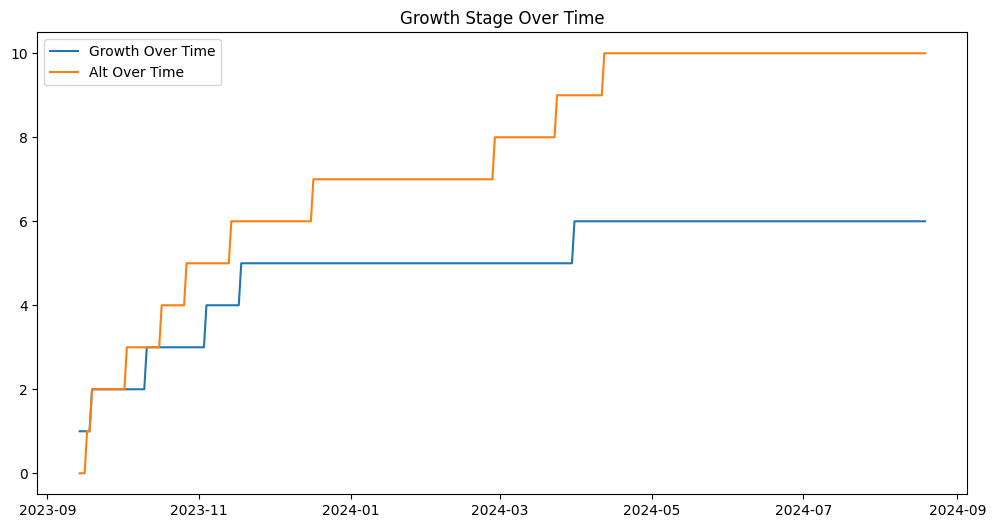

In [ ]:
season_df=huron_df.filter(pl.col('planting2023')==1)


plt.figure(figsize=(12,6))

x=season_df['date'].to_pandas()

y=season_df['growth_stage_num'].to_pandas()

y1=season_df['growth_stage_alt_num'].to_pandas()

# y2=season_df['ndgdd_stage_num_haun'].to_pandas()

plt.plot(x,y,label='Growth Over Time')
plt.plot(x,y1,label='Alt Over Time')
# plt.plot(x,y2,label='Haun Stage (NDGDD)')

plt.legend()
plt.title('Growth Stage Over Time')
plt.show()

### Earth Engine Sentinel

In [ ]:
import ee
import geopandas as gpd
import json

# Authenticate and initialize EE

# Load Huron County geometry from your local GeoJSON file
gdf = gpd.read_file("huron_county.geojson")
aoi_json = json.loads(gdf.to_json())
aoi_ee = ee.FeatureCollection(aoi_json)

# Function to add EVI band
def add_evi(image):
    evi = image.expression(
        '2.5 * ((NIR - RED) / (NIR + 6 * RED - 7.5 * BLUE + 1))',
        {
            'NIR': image.select('B8'),
            'RED': image.select('B4'),
            'BLUE': image.select('B2')
        }).rename('EVI')
    return image.addBands(evi)

# Load Sentinel-2 data
s2 = (ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
      .filterBounds(aoi_ee)
      .filterDate("2023-01-14", "2023-09-01")
      .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 40))
      .map(add_evi)
      .select("EVI"))

# Create a count image: count non-null EVI observations
evi_count = s2.count()

# Clip to AOI
evi_count_clip = evi_count.clip(aoi_ee)

# Visualization params
vis_params = {
    'min': 0,
    'max': 30,
    'palette': ['black', 'purple', 'blue', 'green', 'yellow']
}

# Display using geemap
import geemap
Map = geemap.Map(center=[43.8, -82.7], zoom=8)  # center on Huron County
Map.addLayer(evi_count_clip, vis_params, "Valid EVI Observations")
Map.addLayer(aoi_ee.style(color='red', fillColor='00000000'), {}, "AOI")
Map.add_colorbar(vis_params, label='Valid Observations')
Map


Map(center=[43.8, -82.7], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI…